In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sea
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from kneed import KneeLocator
import plotly.express as px
import plotly.graph_objs as go
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score, silhouette_score
import scipy.cluster.hierarchy as sch
from sklearn import mixture
from sklearn.cluster import MeanShift

# Import data

In [2]:
data = pd.read_csv('online_shoppers_intention.csv') 
display(data.head(10))

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
5,0,0.0,0,0.0,19,154.216667,0.015789,0.024561,0.0,0.0,Feb,2,2,1,3,Returning_Visitor,False,False
6,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.0,0.4,Feb,2,4,3,3,Returning_Visitor,False,False
7,1,0.0,0,0.0,0,0.000000,0.200000,0.200000,0.0,0.0,Feb,1,2,1,5,Returning_Visitor,True,False
8,0,0.0,0,0.0,2,37.000000,0.000000,0.100000,0.0,0.8,Feb,2,2,2,3,Returning_Visitor,False,False
9,0,0.0,0,0.0,3,738.000000,0.000000,0.022222,0.0,0.4,Feb,2,4,1,2,Returning_Visitor,False,False


### Data Description: 
The dataset consists of feature vectors belonging to 12,330 sessions. The dataset was formed so that each session would belong to a different user in a 1-year period to avoid any tendency to a specific campaign, special day, user profile, or period. Of the 12,330 sessions in the dataset, 84.5% (10,422) were negative class samples that did not end with shopping, and the rest (1908) were positive class samples ending with shopping.

#### Numerical features
| Feature name | Feature description                                                 | Min. val | Max. val | SD     |
|:-------------|:--------------------------------------------------------------------|:---------|:---------|:-------|
| Admin.       | #pages visited by the visitor about account management              | 0        | 27       | 3.32   |
| Ad. duration | #seconds spent by the visitor on account management related pages	 | 0        | 3398     | 176.70 |
| Info.        | #informational pages visited by the visitor                         | 0        | 24       | 1.26   |
| Info. durat. | #seconds spent by the visitor on informational pages	             | 0        | 2549     | 140.64 |
| Prod.        | #pages visited by visitor about product related pages	             | 0        | 705      | 44.45  |
| Prod.durat.  | #seconds spent by the visitor on product related pages	             | 0        | 63,973   | 1912.3 |
| Bounce rate  | Average bounce rate value of the pages visited by the visitor	     | 0        | 0.2      | 0.04   |
| Exit rate	   | Average exit rate value of the pages visited by the visitor         | 0        | 0.2      | 0.05   |
| Page value   | Average page value of the pages visited by the visitor	             | 0        | 361      | 18.55  |
| Special day  | Closeness of the site visiting time to a special day	             | 0        | 1.0      | 0.19   |

#### Categorical features
| Feature name        | Feature description                                                      | Number of Values |
|:--------------------|:-------------------------------------------------------------------------|:-----------------|
| OperatingSystems    | Operating system of the visitor                                          | 8                |
| Browser             | Browser of the visitor                                                   | 13               |
| Region              | Geographic region from which the session has been started by the visitor | 9                |
| TrafficType         | Traffic source (e.g., banner, SMS, direct)                               | 20               |
| VisitorType         | Visitor type as “New Visitor,” “Returning Visitor,” and “Other”	         | 3                |
| Weekend             | Boolean value indicating whether the date of the visit is weekend        | 2                |
| Month               | Month value of the visit date                                            | 12               |
| Revenue             | Class label: whether the visit has been finalized with a transaction     | 2                |

# Droping some features

Odlucili smo da izbacimo ficere OperatingSystems i Browser jer smatramo da  hardver ili softver sistema na kojem se obavlja kupovina ne utiče na ponašanje pri kupovini.

In [3]:
data=data.drop(['OperatingSystems', 'Browser'],axis=1 )

In [4]:
data = data[data['VisitorType'] != 'Other']

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12245 entries, 0 to 12329
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12245 non-null  int64  
 1   Administrative_Duration  12245 non-null  float64
 2   Informational            12245 non-null  int64  
 3   Informational_Duration   12245 non-null  float64
 4   ProductRelated           12245 non-null  int64  
 5   ProductRelated_Duration  12245 non-null  float64
 6   BounceRates              12245 non-null  float64
 7   ExitRates                12245 non-null  float64
 8   PageValues               12245 non-null  float64
 9   SpecialDay               12245 non-null  float64
 10  Month                    12245 non-null  object 
 11  Region                   12245 non-null  int64  
 12  TrafficType              12245 non-null  int64  
 13  VisitorType              12245 non-null  object 
 14  Weekend                  12

# First-Looking to Data And Analyzing

In [6]:
data.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Region,TrafficType
count,12245.000000,12245.000000,12245.000000,12245.000000,12245.000000,12245.000000,12245.000000,12245.000000,12245.000000,12245.000000,12245.000000,12245.000000
mean,2.321029,80.944413,0.505839,34.630576,31.865169,1199.080153,0.022078,0.042932,5.803858,0.061854,3.121437,4.002858
std,3.326056,176.579347,1.272970,141.137281,44.548083,1916.732843,0.048201,0.048378,18.075511,0.199540,2.375767,3.898928
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,186.250000,0.000000,0.014286,0.000000,0.000000,1.000000,2.000000
50%,1.000000,8.000000,0.000000,0.000000,18.000000,602.583333,0.003175,0.025137,0.000000,0.000000,3.000000,2.000000
75%,4.000000,93.600000,0.000000,0.000000,38.000000,1472.000000,0.016923,0.050000,0.000000,0.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,9.000000,20.000000


In [7]:
data.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

# Vizualize Data

### Distribution of categorical features 

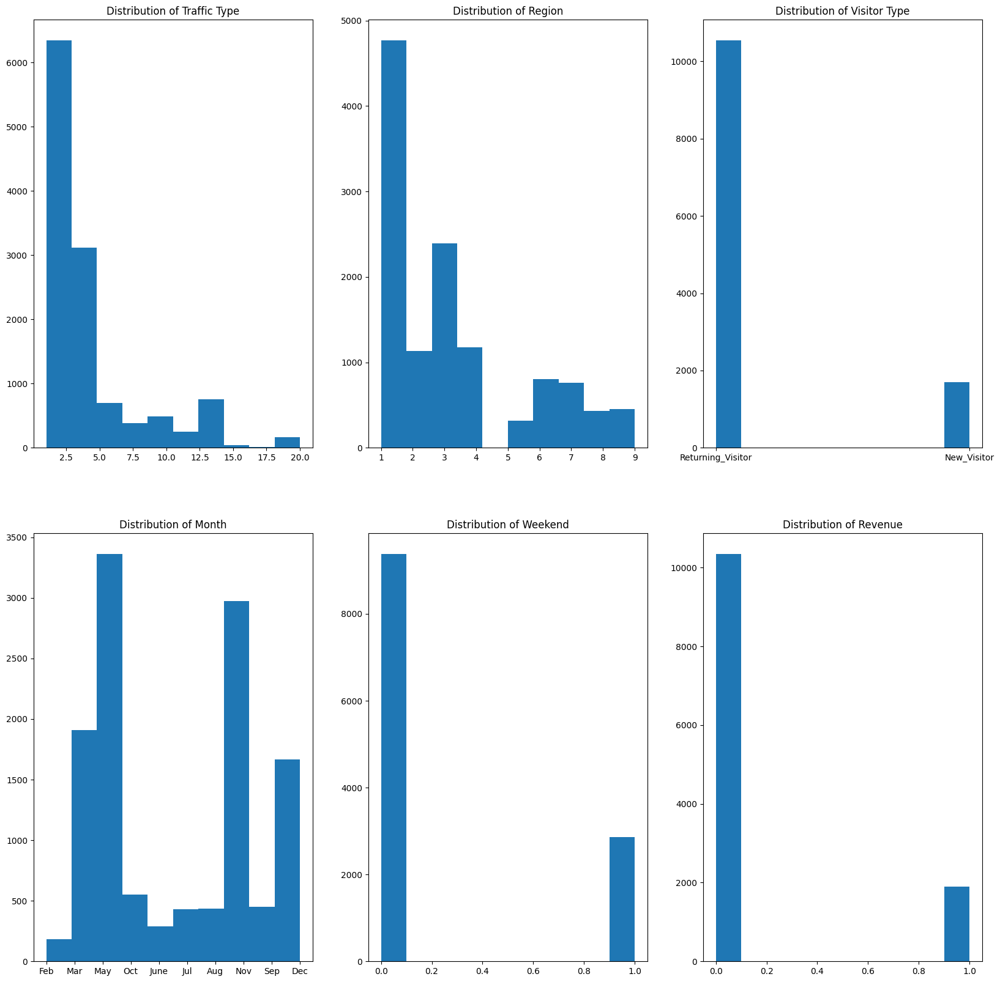

In [8]:
fig,((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(20,20))

ax1.hist(data["TrafficType"])
ax1.set_title("Distribution of Traffic Type")

ax2.hist(data["Region"])
ax2.set_title("Distribution of Region")

ax3.hist(data["VisitorType"])
ax3.set_title("Distribution of Visitor Type")

ax4.hist(data["Month"])
ax4.set_title("Distribution of Month")

ax5.hist(data["Weekend"].astype(int))
ax5.set_title("Distribution of Weekend")

ax6.hist(data["Revenue"].astype(int))
ax6.set_title("Distribution of Revenue")

plt.show()

### Distribution of numerical features 

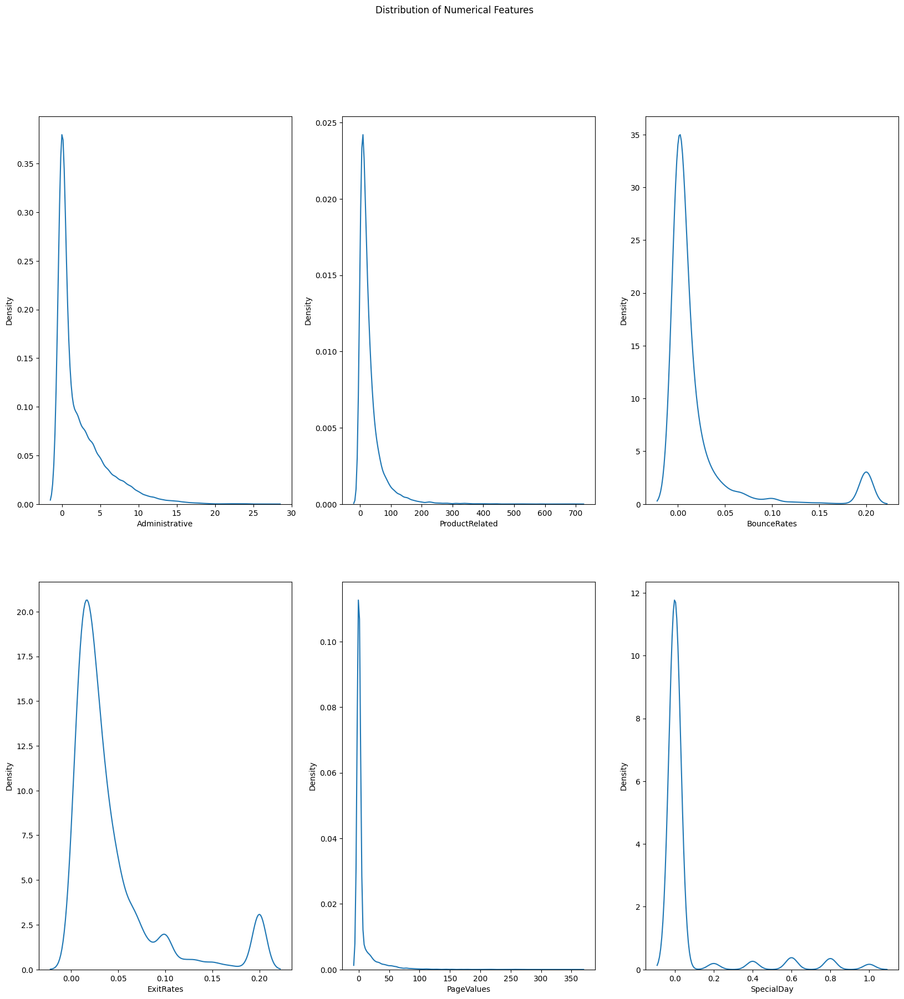

In [9]:
fig,((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(20,20))

sea.kdeplot(data["Administrative"], ax=ax1, legend=None)

sea.kdeplot(data["ProductRelated"], ax=ax2, legend=None)

sea.kdeplot(data["BounceRates"], ax=ax3, legend=None)

sea.kdeplot(data["ExitRates"], ax=ax4, legend=None)

sea.kdeplot(data["PageValues"], ax=ax5, legend=None)

sea.kdeplot(data["SpecialDay"], ax=ax6, legend=None)

plt.suptitle("Distribution of Numerical Features")
plt.show()

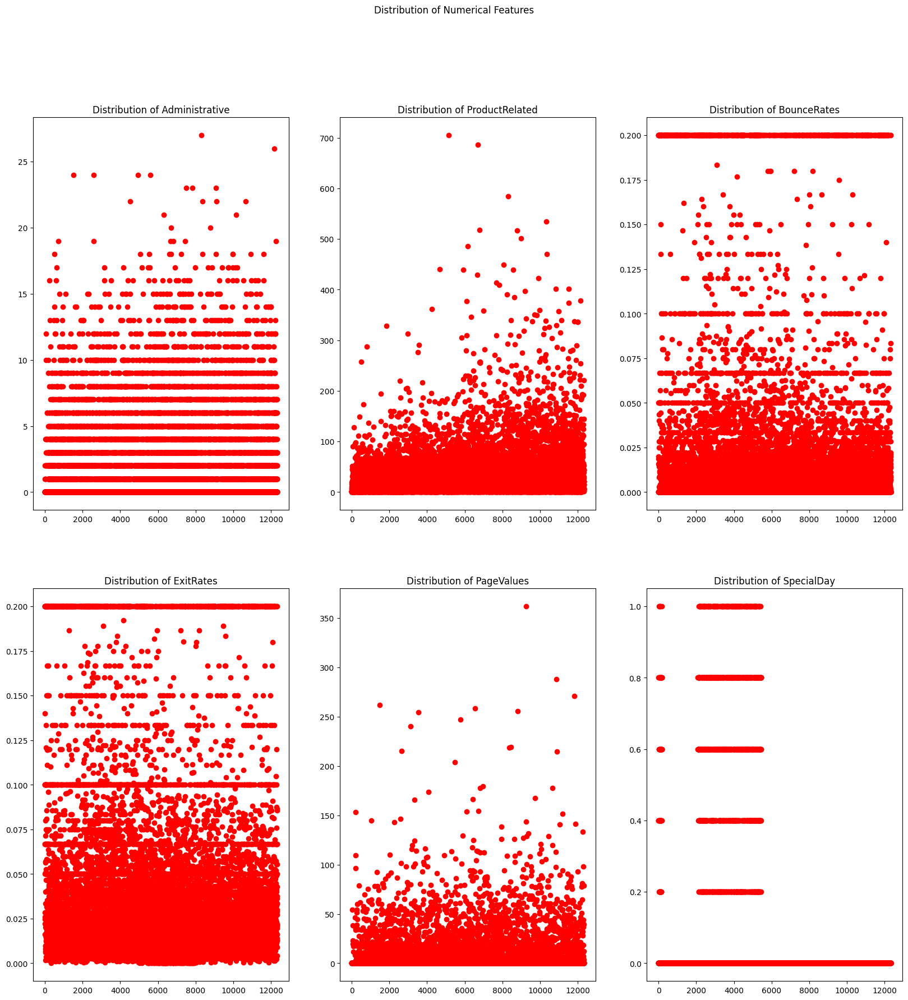

In [10]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(20, 20))

ax1.plot(data["Administrative"], 'ro')
ax1.set_title("Distribution of Administrative")

ax2.plot(data["ProductRelated"], 'ro')
ax2.set_title("Distribution of ProductRelated")

ax3.plot(data["BounceRates"], 'ro')
ax3.set_title("Distribution of BounceRates")

ax4.plot(data["ExitRates"], 'ro')
ax4.set_title("Distribution of ExitRates")

ax5.plot(data["PageValues"], 'ro')
ax5.set_title("Distribution of PageValues")

ax6.plot(data["SpecialDay"], 'ro')
ax6.set_title("Distribution of SpecialDay")

plt.suptitle("Distribution of Numerical Features")

plt.show()

# Data Pre-Processing

In [11]:
# izbacivanje vrednost (kolona) gde se nalazi NaN 
data=data.dropna(axis=0)
data.shape

(12245, 16)

In [12]:
# uklanjannje duplicirane redove
data = data.drop_duplicates()
data.shape

(11998, 16)

## Feature Encoding

U datasetu postoje:
- 4 kategoričkih atributa: Month, Region, TrafficType i VisitorType
- 2 boolean atributa: Weekend, Revenue

Planirane transformacije:
- Label encoding za atribute Month (1-12), Revenue, Weekend (False: 0, True: 1);
- One-hot encoding za atribut VisitorType

### Label Encoding (Revenue, Weekend)

In [13]:
data['Revenue'] = LabelEncoder().fit_transform(data['Revenue'])
data['Weekend'] = LabelEncoder().fit_transform(data['Weekend'])

In [14]:
# label encoding for Month
mapping_month = {'Jan' : 1, 'Feb' : 2,
                 'Mar' : 3, 'Apr' : 4,
                 'May' : 5, 'June' : 6,
                 'Jul' : 7, 'Aug' : 8,
                 'Sep' : 9, 'Oct' : 10,
                 'Nov' : 11, 'Dec' : 12}

data['Month'] = data['Month'].map(mapping_month)

### One Hot Encoding Feature Categorical

In [15]:
# change feature VisitorType to feature dummies with VT prefix
onehot = pd.get_dummies(data['VisitorType'], prefix = 'VT')
onehot.replace({False: 0, True: 1}, inplace=True)
print(onehot.head())


   VT_New_Visitor  VT_Returning_Visitor
0               0                     1
1               0                     1
2               0                     1
3               0                     1
4               0                     1


In [16]:
data = data.join(onehot)

# drop feature VisitorType
data = data.drop(['VisitorType'], axis = 1)

In [17]:
# save the processed data into the df_processed dataset
data = data.copy()
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11998 entries, 0 to 12329
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           11998 non-null  int64  
 1   Administrative_Duration  11998 non-null  float64
 2   Informational            11998 non-null  int64  
 3   Informational_Duration   11998 non-null  float64
 4   ProductRelated           11998 non-null  int64  
 5   ProductRelated_Duration  11998 non-null  float64
 6   BounceRates              11998 non-null  float64
 7   ExitRates                11998 non-null  float64
 8   PageValues               11998 non-null  float64
 9   SpecialDay               11998 non-null  float64
 10  Month                    11998 non-null  int64  
 11  Region                   11998 non-null  int64  
 12  TrafficType              11998 non-null  int64  
 13  Weekend                  11998 non-null  int64  
 14  Revenue                  11

In [18]:
data.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,Region,TrafficType,Weekend,Revenue,VT_New_Visitor,VT_Returning_Visitor
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,2,1,1,0,0,0,1
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,2,1,2,0,0,0,1
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,2,9,3,0,0,0,1
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,2,2,4,0,0,0,1
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,2,1,4,1,0,0,1


## Corellation matrix

<Axes: >

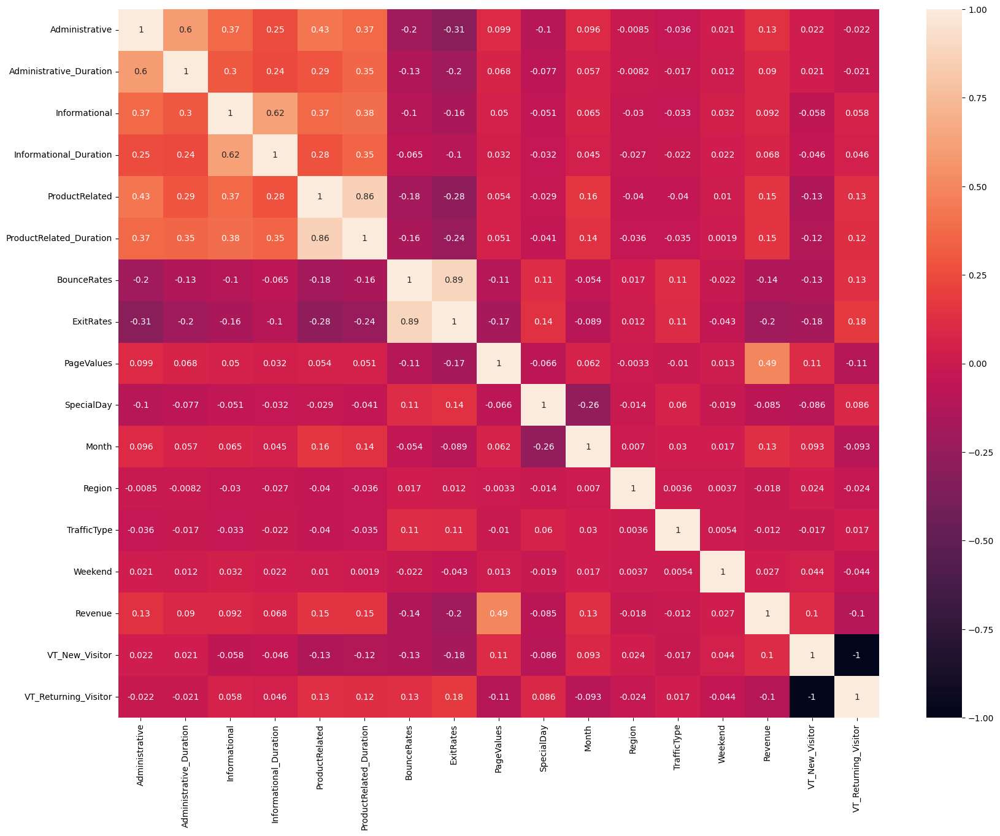

In [19]:
fig, ax = plt.subplots(figsize=(20,15))
sea.heatmap(data.corr(),annot=True, ax=ax)

Izbacujemo kolone koje imaju veliku korelacionu vrednost

In [20]:
data=data.drop(['Administrative_Duration','Informational_Duration','ProductRelated_Duration','BounceRates'],axis=1 )

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11998 entries, 0 to 12329
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Administrative        11998 non-null  int64  
 1   Informational         11998 non-null  int64  
 2   ProductRelated        11998 non-null  int64  
 3   ExitRates             11998 non-null  float64
 4   PageValues            11998 non-null  float64
 5   SpecialDay            11998 non-null  float64
 6   Month                 11998 non-null  int64  
 7   Region                11998 non-null  int64  
 8   TrafficType           11998 non-null  int64  
 9   Weekend               11998 non-null  int64  
 10  Revenue               11998 non-null  int64  
 11  VT_New_Visitor        11998 non-null  int64  
 12  VT_Returning_Visitor  11998 non-null  int64  
dtypes: float64(3), int64(10)
memory usage: 1.5 MB


## Discretization

Podaci za određene promenljive ('Informational', 'ProductRelated', 'PageValues', 'Administrative') većinom koncentrisani u određenom opsegu vrednosti  (oko 0), dok izvan tog opsega postoje retke i ekstremne vrednosti (outlier-i)

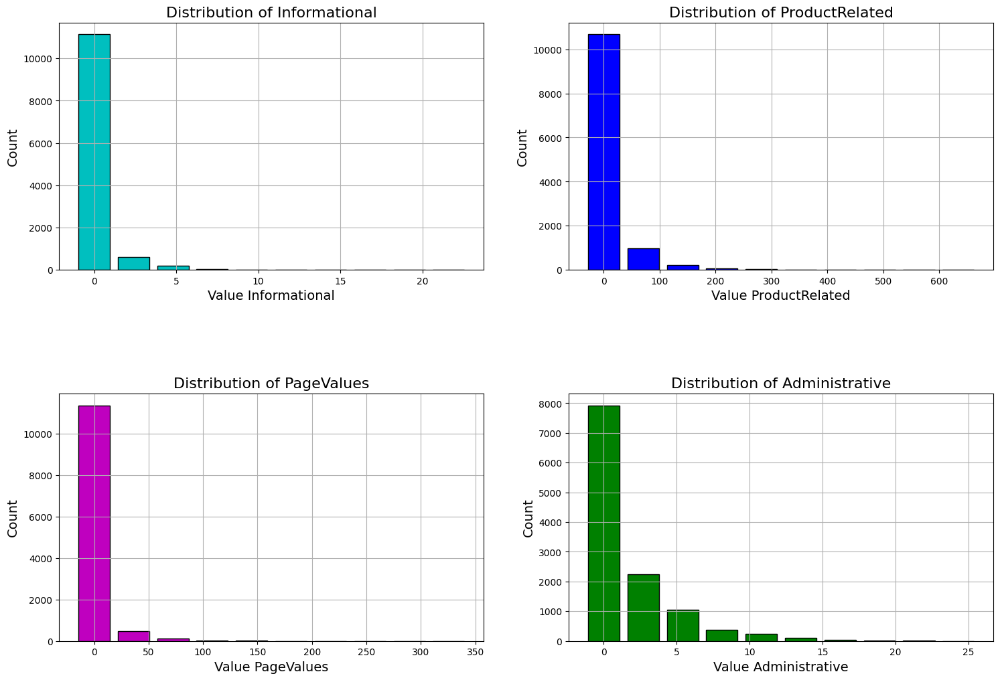

In [22]:
descritized_Data = data.copy()

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Lista promenljivih i boja
variables = ['Informational', 'ProductRelated', 'PageValues', 'Administrative']
colors = ['c', 'b', 'm', 'g']

for ax, variable, color in zip(axes.flatten(), variables, colors):
    ax.hist(descritized_Data[variable], color=color, edgecolor='black', align='left', rwidth=0.8)

    ax.set_title(f'Distribution of {variable}', fontsize=16)
    ax.set_xlabel(f'Value {variable}', fontsize=14)
    ax.set_ylabel('Count', fontsize=14)
    ax.grid(True)

plt.subplots_adjust(hspace=0.5)
plt.show()

In [23]:
descritized_Data['Informational'] = descritized_Data['Informational'].apply(lambda x: 1 if x > 0 else 0)
descritized_Data['Administrative'] = descritized_Data['Administrative'].apply(lambda x: 1 if x > 0 else 0)
descritized_Data['ProductRelated'] = descritized_Data['ProductRelated'].apply(lambda x: 1 if x > 25 else 0)
descritized_Data['PageValues'] = descritized_Data['PageValues'].apply(lambda x: 1 if x > 0 else 0)

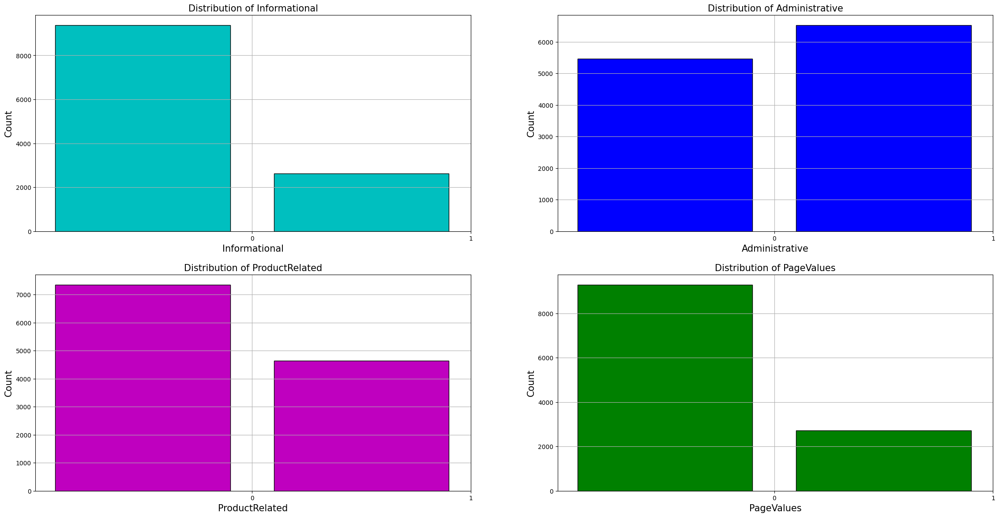

In [24]:
plt.rcParams['figure.figsize'] = (28, 14)

fig, axes = plt.subplots(2, 2)

# Lista promenljivih i boja
variables = ['Informational', 'Administrative', 'ProductRelated', 'PageValues']
colors = ['c', 'b', 'm', 'g']

for ax, variable, color in zip(axes.flatten(), variables, colors):
    ax.hist(descritized_Data[variable], color=color, bins=[-0.5, 0.5, 1.5], edgecolor='black', align='left', rwidth=0.8)

    ax.set_title(f'Distribution of {variable}', fontsize=15)
    ax.set_xlabel(f'{variable}', fontsize=15)
    ax.set_ylabel('Count', fontsize=15)
    ax.set_xticks([0, 1])
    ax.grid(True)

plt.show()


## Outliers

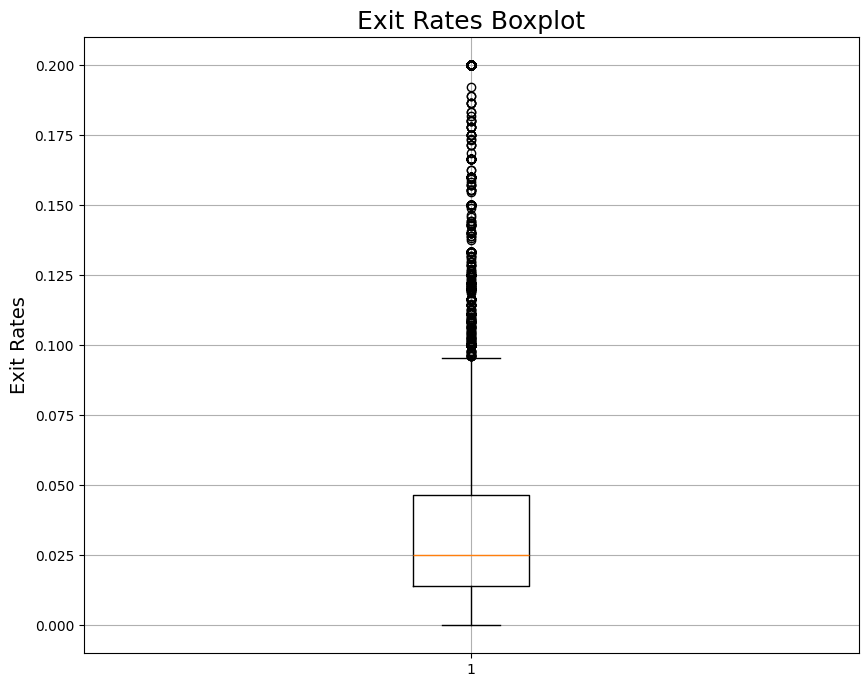

In [25]:
fig, ax = plt.subplots(figsize=(10, 8))

ax.boxplot(descritized_Data["ExitRates"])
ax.set_title("Exit Rates Boxplot", fontsize=18)
ax.set_ylabel("Exit Rates", fontsize=14)
ax.grid(True)

plt.show()


In [26]:
nominalColumns = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'Region', 'TrafficType', 'Region', 'SpecialDay']
columns = ['Month', 'VT_Returning_Visitor', 'VT_New_Visitor', 'Weekend', 'Revenue', 'Region', 'TrafficType', 'Region', 'SpecialDay','Informational','PageValues']

def iqr_outliers(data):
    numeric_columns = [col for col in data.columns if col not in columns]
    
    for col in numeric_columns:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        outliers = (data[col] < lower_bound) | (data[col] > upper_bound)
        data = data[~outliers]

    data.reset_index(drop=True, inplace=True)
    
    return data

In [27]:
descritized_Data = iqr_outliers(descritized_Data)
print(descritized_Data.shape)
descritized_Data.head()

(10805, 13)


,Administrative,Informational,ProductRelated,ExitRates,PageValues,SpecialDay,Month,Region,TrafficType,Weekend,Revenue,VT_New_Visitor,VT_Returning_Visitor
0,0,0,0,0.050000,0,0.0,2,1,4,1,0,0,1
1,0,0,0,0.024561,0,0.0,2,1,3,0,0,0,1
2,0,0,0,0.022222,0,0.4,2,1,2,0,0,0,1
3,0,0,0,0.066667,0,0.0,2,3,3,0,0,0,1
4,0,0,0,0.025833,0,0.4,2,4,3,0,0,0,1


## Corellation matrix

<Axes: >

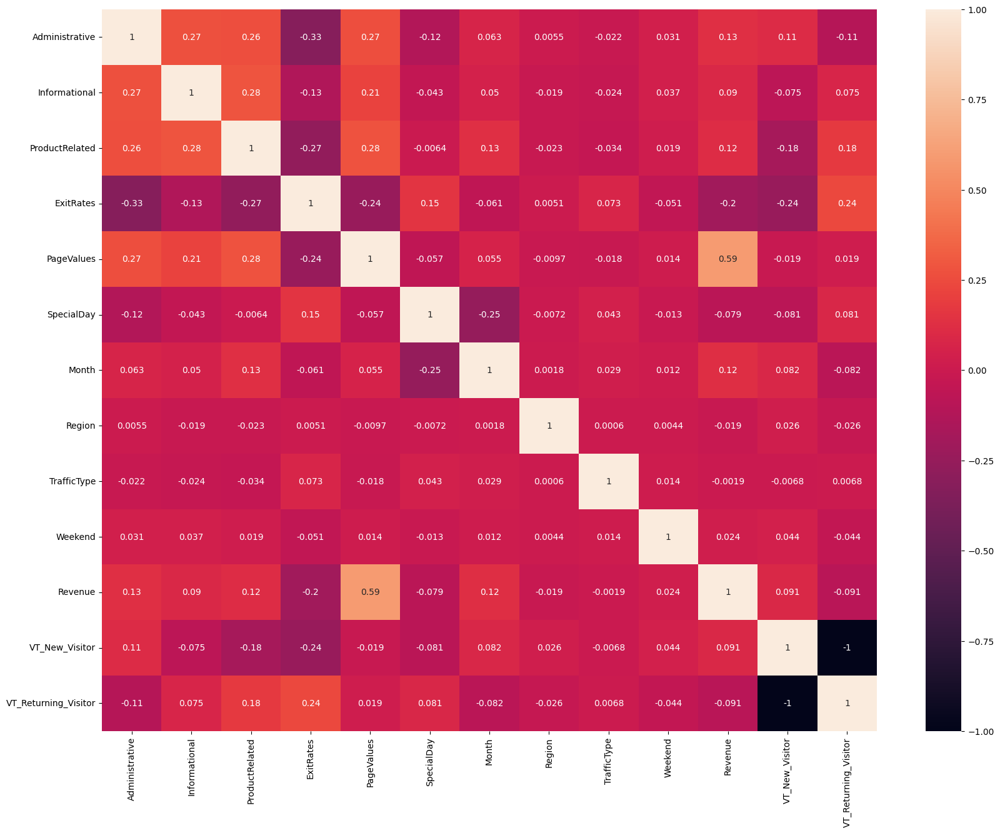

In [28]:
fig, ax = plt.subplots(figsize=(20,15))
sea.heatmap(descritized_Data.corr(),annot=True, ax=ax)

### Standardisation

In [29]:
data_unscaled=descritized_Data.copy()

In [30]:
scale=StandardScaler()
def standard_scale(data):
    datapom=pd.DataFrame()
    datapom = pd.DataFrame(scale.fit_transform(data.values), columns=data.columns, index=data.index)
    return datapom

In [31]:
descritized_Data=standard_scale(descritized_Data)
descritized_Data.head()

,Administrative,Informational,ProductRelated,ExitRates,PageValues,SpecialDay,Month,Region,TrafficType,Weekend,Revenue,VT_New_Visitor,VT_Returning_Visitor
0,-1.217923,-0.563063,-0.866727,1.141819,-0.579167,-0.294800,-1.701567,-0.896426,0.024874,1.773753,-0.459551,-0.424079,0.424079
1,-1.217923,-0.563063,-0.866727,-0.152383,-0.579167,-0.294800,-1.701567,-0.896426,-0.240174,-0.563776,-0.459551,-0.424079,0.424079
2,-1.217923,-0.563063,-0.866727,-0.271390,-0.579167,1.788466,-1.701567,-0.896426,-0.505222,-0.563776,-0.459551,-0.424079,0.424079
3,-1.217923,-0.563063,-0.866727,1.989744,-0.579167,-0.294800,-1.701567,-0.057313,-0.240174,-0.563776,-0.459551,-0.424079,0.424079
4,-1.217923,-0.563063,-0.866727,-0.087673,-0.579167,1.788466,-1.701567,0.362244,-0.240174,-0.563776,-0.459551,-0.424079,0.424079


In [32]:
descritized_Data.describe()

,Administrative,Informational,ProductRelated,ExitRates,PageValues,SpecialDay,Month,Region,TrafficType,Weekend,Revenue,VT_New_Visitor,VT_Returning_Visitor
count,1.080500e+04,1.080500e+04,1.080500e+04,1.080500e+04,1.080500e+04,1.080500e+04,10805.000000,1.080500e+04,1.080500e+04,1.080500e+04,1.080500e+04,1.080500e+04,1.080500e+04
mean,-2.051729e-16,-5.260844e-18,-5.260844e-18,-1.236298e-16,8.581752e-17,-2.104338e-17,0.000000,-4.208675e-17,-1.315211e-17,2.367380e-17,3.682591e-17,7.891266e-18,-7.891266e-18
std,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00,1.000046e+00
min,-1.217923e+00,-5.630635e-01,-8.667269e-01,-1.401957e+00,-5.791670e-01,-2.947999e-01,-1.701567,-8.964260e-01,-7.702705e-01,-5.637762e-01,-4.595510e-01,-4.240787e-01,-2.358053e+00
25%,-1.217923e+00,-5.630635e-01,-8.667269e-01,-7.454985e-01,-5.791670e-01,-2.947999e-01,-0.812035,-8.964260e-01,-5.052225e-01,-5.637762e-01,-4.595510e-01,-4.240787e-01,4.240787e-01
50%,8.210698e-01,-5.630635e-01,-8.667269e-01,-2.693709e-01,-5.791670e-01,-2.947999e-01,0.077496,-5.731287e-02,-5.052225e-01,-5.637762e-01,-4.595510e-01,-4.240787e-01,4.240787e-01
75%,8.210698e-01,-5.630635e-01,1.153766e+00,5.133568e-01,1.726618e+00,-2.947999e-01,0.967028,3.622437e-01,2.487355e-02,-5.637762e-01,-4.595510e-01,-4.240787e-01,4.240787e-01
max,8.210698e-01,1.775999e+00,1.153766e+00,3.451685e+00,1.726618e+00,4.913365e+00,1.263538,2.460027e+00,4.265642e+00,1.773753e+00,2.176037e+00,2.358053e+00,4.240787e-01


# Clustering 

## PCA

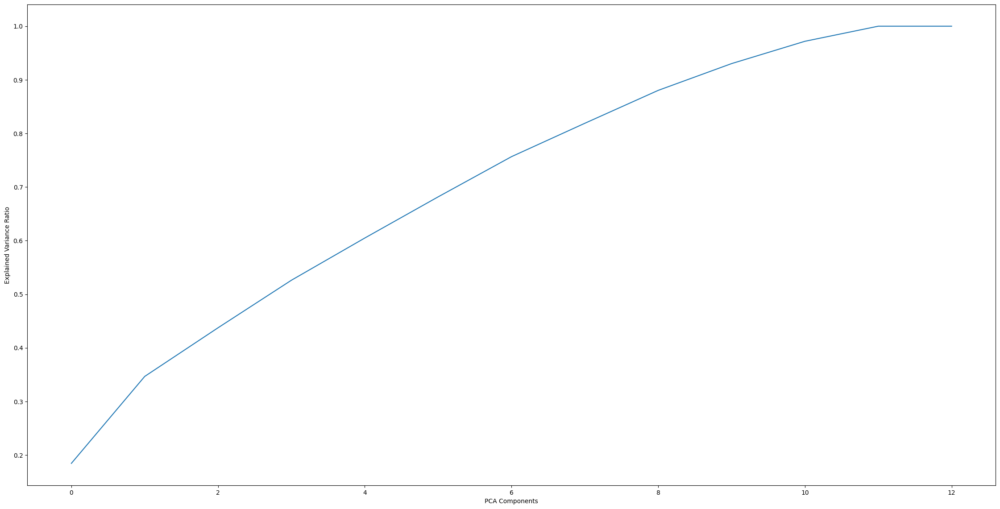

In [33]:
pca = PCA()
pca.fit(descritized_Data)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.xlabel("PCA Components")
plt.ylabel("Explained Variance Ratio")
plt.show()


In [34]:
pca = PCA(n_components=3)
pca.fit(descritized_Data)
pca_scores = pca.transform(descritized_Data)
principalComponents = pd.DataFrame(pca_scores, columns=(["f1","f2", "f3"]))


## Exclusive Clustering


#### Elbow method

In [35]:
kmeans_kwargs = {"init": "random", "n_init": 10, "max_iter": 300, "random_state": 42,  }
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pca_scores)
    sse.append(kmeans.inertia_)

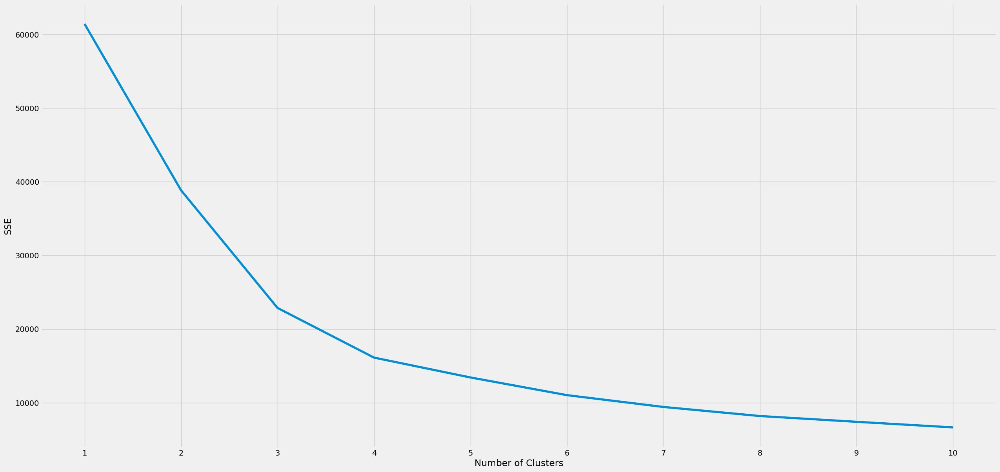

In [36]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [37]:
kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")
kl.elbow

4

#### Silhouette coefficient 

In [38]:
silhouette_coefficients = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pca_scores)
    score = silhouette_score(pca_scores, kmeans.labels_)
    silhouette_coefficients.append(score)
        
best_n_clusters = np.argmax(silhouette_coefficients) + 2  # +2 jer smo krenuli od n_clusters=2
best_silhouette_score = silhouette_coefficients[np.argmax(silhouette_coefficients)]

print(f"Najbolji broj klastera: {best_n_clusters}")
print(f"Najbolji Silhouette Coefficient: {best_silhouette_score}")

Najbolji broj klastera: 2
Najbolji Silhouette Coefficient: 0.5040208412646334


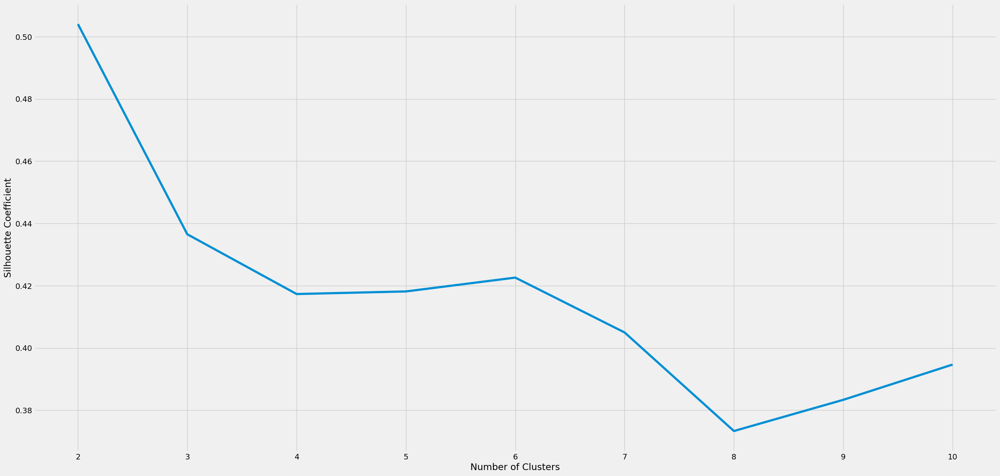

In [39]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

#### Calinski-Harabasz Index

In [40]:
no_of_clusters = range(2,20) 
ch = []


for f in no_of_clusters:
    kmeans = KMeans(n_clusters=f, **kmeans_kwargs)
    kmeans = kmeans.fit(pca_scores)
    score = calinski_harabasz_score(pca_scores, kmeans.labels_)
    ch.append(score)
    print("The calinski_harabasz_score for :", f, "Clusters is:", score)

The calinski_harabasz_score for : 2 Clusters is: 6286.282528397506
The calinski_harabasz_score for : 3 Clusters is: 9120.50781046385
The calinski_harabasz_score for : 4 Clusters is: 10133.41720413969
The calinski_harabasz_score for : 5 Clusters is: 9672.112880552286
The calinski_harabasz_score for : 6 Clusters is: 9896.402671201473
The calinski_harabasz_score for : 7 Clusters is: 9960.938836824842
The calinski_harabasz_score for : 8 Clusters is: 10056.304302213044
The calinski_harabasz_score for : 9 Clusters is: 9876.936196932302
The calinski_harabasz_score for : 10 Clusters is: 9922.931364539309
The calinski_harabasz_score for : 11 Clusters is: 9679.581636318384
The calinski_harabasz_score for : 12 Clusters is: 9478.561387144493
The calinski_harabasz_score for : 13 Clusters is: 9506.123100619146
The calinski_harabasz_score for : 14 Clusters is: 9583.33393211862
The calinski_harabasz_score for : 15 Clusters is: 9217.46871473346
The calinski_harabasz_score for : 16 Clusters is: 9126.214

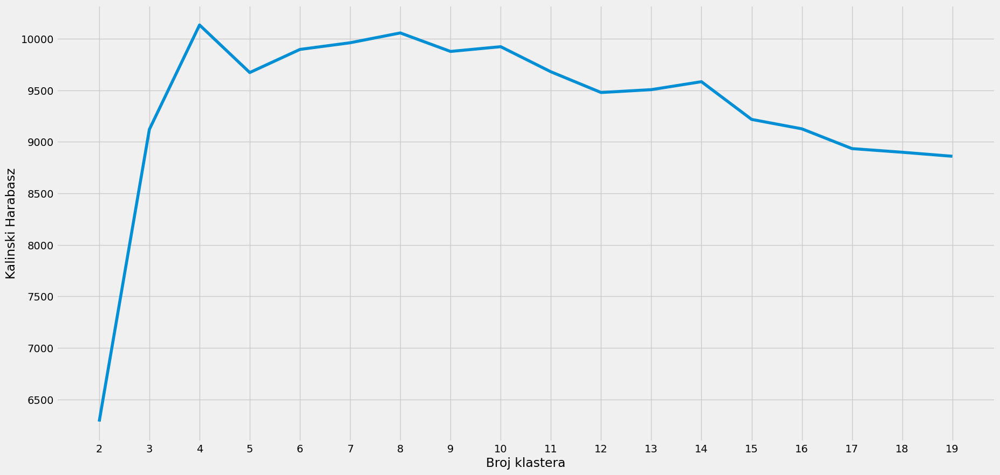

In [41]:
plt.figure(figsize=(20, 10))
plt.style.use("fivethirtyeight")
plt.plot(range(2, 20), ch)
plt.xticks(range(2, 20))
plt.xlabel("Broj klastera")
plt.ylabel("Kalinski Harabasz")
plt.show()

## Exclusive Clustering

### KMeans

In [42]:
kmeans_pca = KMeans(n_clusters=2, init = 'k-means++',random_state=0)
cl= kmeans_pca.fit_predict(descritized_Data)

sil_score2 = silhouette_score(descritized_Data, cl)
cal_score2 = calinski_harabasz_score(descritized_Data, cl)
db_score2 = davies_bouldin_score(descritized_Data, cl)
   
print("clusters: 2" )
print(cl)
print("calinski_harabasz_score", cal_score2)
print("Silhouette score: ", sil_score2)
print("Davies-Bouldin score: ",db_score2)


kmeans_pca1 = KMeans(n_clusters=3, init = 'k-means++',random_state=0)
cl1= kmeans_pca1.fit_predict(descritized_Data)

sil_score3 = silhouette_score(descritized_Data, cl1)
cal_score3 = calinski_harabasz_score(descritized_Data, cl1)
db_score3 = davies_bouldin_score(descritized_Data, cl1)
   
print("\nclusters: 3")
print(cl1)
print("calinski_harabasz_score", cal_score3)
print("Silhouette score: ", sil_score3)
print("Davies-Bouldin score: ", db_score3)

kmeans_pca2 = KMeans(n_clusters=4, init = 'k-means++',random_state=0)
cl2= kmeans_pca2.fit_predict(descritized_Data)
sil_score = silhouette_score(descritized_Data, cl2)
   
print("\nclusters: 4")
print(cl2)
print("calinski_harabasz_score", calinski_harabasz_score(descritized_Data, cl2))
print("Silhouette score: ", sil_score)
print("Davies-Bouldin score: ", davies_bouldin_score(descritized_Data, cl2))

c:\Users\Sokol\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


clusters: 2
[0 0 0 ... 0 0 1]
calinski_harabasz_score 2116.6734068799333
Silhouette score:  0.25400190137725603
Davies-Bouldin score:  1.5264358103873903


c:\Users\Sokol\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



clusters: 3
[0 0 0 ... 0 0 1]
calinski_harabasz_score 2089.9909152834216
Silhouette score:  0.17987466663792315
Davies-Bouldin score:  1.9591285705216739


c:\Users\Sokol\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



clusters: 4
[3 3 2 ... 3 3 1]
calinski_harabasz_score 1856.116764228484
Silhouette score:  0.18719566652409164
Davies-Bouldin score:  1.8015503386154132


In [43]:
# dataset za rezultate 
kmeansScore = [['KMeans', 2, cal_score2, sil_score2, db_score2]]
columns = ['algorithm', 'number of clusters', 'calinski_harabasz_score', 'silhouette_score', 'davies_bouldin_score']

cluster_results_df = pd.DataFrame(kmeansScore, columns=columns)

c:\Users\Sokol\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


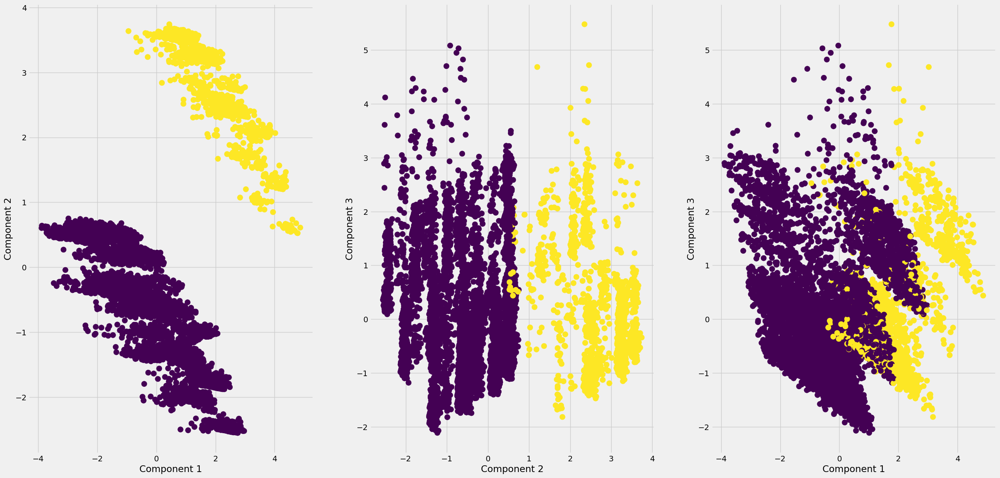

In [44]:
# Prvi plot
kmeans_pca = KMeans(n_clusters=2, init = 'k-means++',random_state=0)
cl= kmeans_pca.fit_predict(descritized_Data)
centroids1=kmeans_pca.cluster_centers_
plt.subplot(1, 3, 1)  
plt.scatter(x=principalComponents['f1'], y=principalComponents['f2'], c=cl, cmap='viridis', s=100)
plt.xlabel(f'Component 1')
plt.ylabel(f'Component 2')

# Drugi plot
plt.subplot(1, 3, 2)  
plt.scatter(x=principalComponents['f2'], y=principalComponents['f3'], c=cl, cmap='viridis', s=100)
plt.xlabel(f'Component 2')
plt.ylabel(f'Component 3')


# Treci plot
plt.subplot(1, 3, 3)  
plt.scatter(x=principalComponents['f1'], y=principalComponents['f3'], c=cl, cmap='viridis', s=100)
plt.xlabel(f'Component 1')
plt.ylabel(f'Component 3')

plt.show()


In [45]:
fig1 = px.scatter_3d(descritized_Data, x=principalComponents['f1'], y=principalComponents['f2'], z=principalComponents['f3'], color=cl,
                     labels={'x': 'C1 ', 'y': 'C2', 'z': 'C3'},
                     title="3 Clusters by PCA Components")
fig1.update_layout(scene=dict(aspectmode="cube"))
fig1.update_layout(width=920, height=600)

fig1.show()

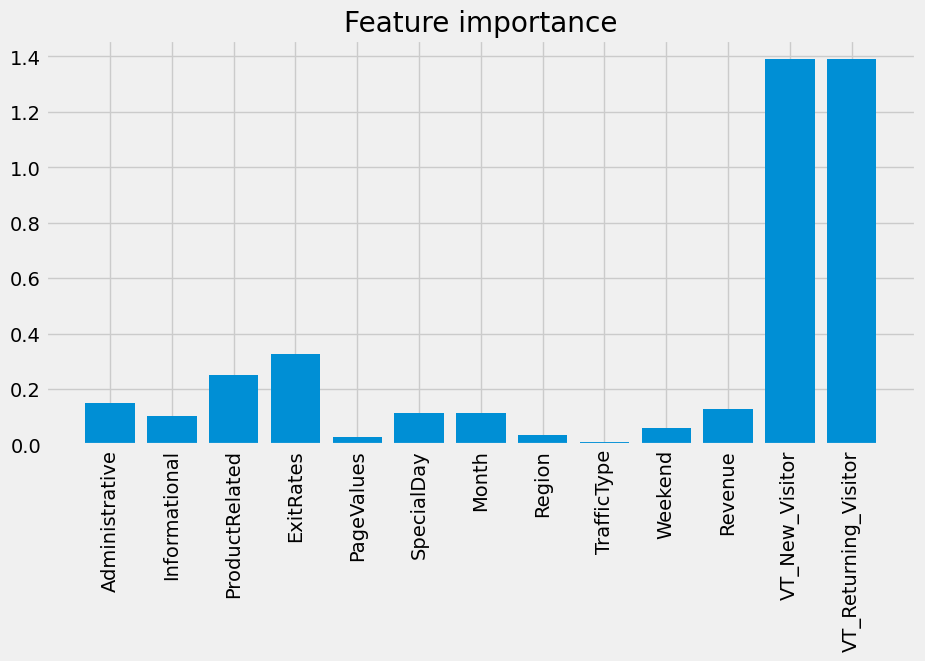

In [46]:
feature_importance = centroids1.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(descritized_Data.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()


#### Drop unimportant features

In [47]:
columnsToDrop =descritized_Data.columns[feature_importance < 0.1]
dataWithImportantColumns = descritized_Data.drop(columns=columnsToDrop)

In [48]:
pca = PCA(n_components=3)
pca.fit(dataWithImportantColumns)
pca_scores1 = pca.fit_transform(dataWithImportantColumns)
pca_scores1.shape

(10805, 3)

In [49]:
principalComponents1 = pd.DataFrame(pca_scores1, columns=(["f1","f2", "f3"]))
principalComponents1.head()

,f1,f2,f3
0,-1.572298,1.666468,0.216929
1,-1.111243,1.260441,0.435942
2,-1.465008,1.537495,1.763968
3,-1.874369,1.932486,0.073438
4,-1.530457,1.595132,1.732878


In [50]:
kmeans_pca = KMeans(n_clusters=2, init = 'k-means++',random_state=0)
cl= kmeans_pca.fit_predict(dataWithImportantColumns)
cal_score2=calinski_harabasz_score(dataWithImportantColumns, cl)
sil_score2 = silhouette_score(dataWithImportantColumns, cl)
db_score2=davies_bouldin_score(dataWithImportantColumns, cl)
   
print("clusters: 2" )
print(cl)
print("calinski_harabasz_score", cal_score2)
print("Silhouette score: ", sil_score2)
print("Davies-Bouldin score: ", db_score2)


kmeans_pca1 = KMeans(n_clusters=3, init = 'k-means++',random_state=0)
cl1= kmeans_pca1.fit_predict(dataWithImportantColumns)
   
print("\nclusters: 3")
print(cl1)
print("calinski_harabasz_score", calinski_harabasz_score(dataWithImportantColumns, cl1))
print("Silhouette score: ", silhouette_score(dataWithImportantColumns, cl1))
print("Davies-Bouldin score: ", davies_bouldin_score(dataWithImportantColumns, cl1))


kmeans_pca2 = KMeans(n_clusters=4, init = 'k-means++',random_state=0)
cl2= kmeans_pca2.fit_predict(dataWithImportantColumns)
   
print("\nclusters: 4")
print(cl2)
print("calinski_harabasz_score", calinski_harabasz_score(dataWithImportantColumns, cl2))
print("Silhouette score: ", silhouette_score(dataWithImportantColumns, cl2))
print("Davies-Bouldin score: ", davies_bouldin_score(dataWithImportantColumns, cl2))

c:\Users\Sokol\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



clusters: 2
[0 0 0 ... 0 0 1]
calinski_harabasz_score 3342.854285352134
Silhouette score:  0.34537589223508985
Davies-Bouldin score:  1.183525815992476

clusters: 3
[2 2 2 ... 2 0 1]
calinski_harabasz_score 3263.316752177021


c:\Users\Sokol\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Silhouette score:  0.24211079757096202
Davies-Bouldin score:  1.5947891072286415

clusters: 4
[1 1 3 ... 1 1 2]
calinski_harabasz_score 3146.3004657228544


c:\Users\Sokol\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Silhouette score:  0.2662570622397836
Davies-Bouldin score:  1.4148319499136837


In [51]:
kmeansPCAScore = [['KMeans with dimensionality reduction', 2, cal_score2, sil_score2, db_score2]]
new_row = pd.DataFrame([dict(zip(columns, kmeansPCAScore[0]))])
cluster_results_df = pd.concat([cluster_results_df, new_row], ignore_index=True)

c:\Users\Sokol\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



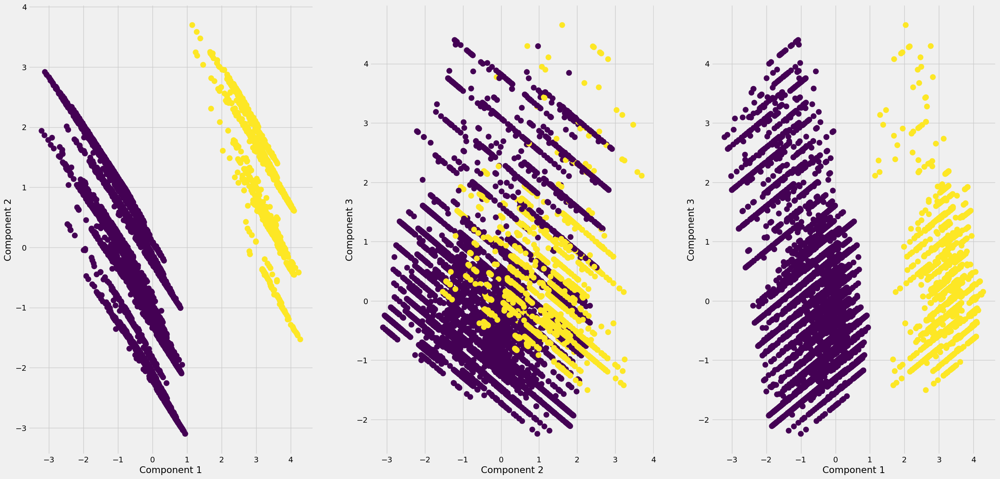

In [52]:
# Prvi plot
kmeans_pca = KMeans(n_clusters=2, init = 'k-means++',random_state=0)
cl= kmeans_pca.fit_predict(dataWithImportantColumns)
plt.subplot(1, 3, 1)  
plt.scatter(x=principalComponents1['f1'], y=principalComponents1['f2'], c=cl, cmap='viridis', s=100)
plt.xlabel(f'Component 1')
plt.ylabel(f'Component 2')

# Drugi plot
plt.subplot(1, 3, 2)  
plt.scatter(x=principalComponents1['f2'], y=principalComponents1['f3'], c=cl, cmap='viridis', s=100)
plt.xlabel(f'Component 2')
plt.ylabel(f'Component 3')

# Treci plot
plt.subplot(1, 3, 3)  
plt.scatter(x=principalComponents1['f1'], y=principalComponents1['f3'], c=cl, cmap='viridis', s=100)
plt.xlabel(f'Component 1')
plt.ylabel(f'Component 3')

plt.show()

In [53]:
centroids1=kmeans_pca.cluster_centers_
fig1 = px.scatter_3d(dataWithImportantColumns, x=principalComponents1['f1'], y=principalComponents1['f2'], z=principalComponents1['f3'], color=cl,
                     labels={'x': 'C1 ', 'y': 'C2', 'z': 'C3'},
                     title="2 Clusters by PCA Components")
fig1.update_layout(scene=dict(aspectmode="cube"))
fig1.update_layout(width=920, height=600)

fig1.show()

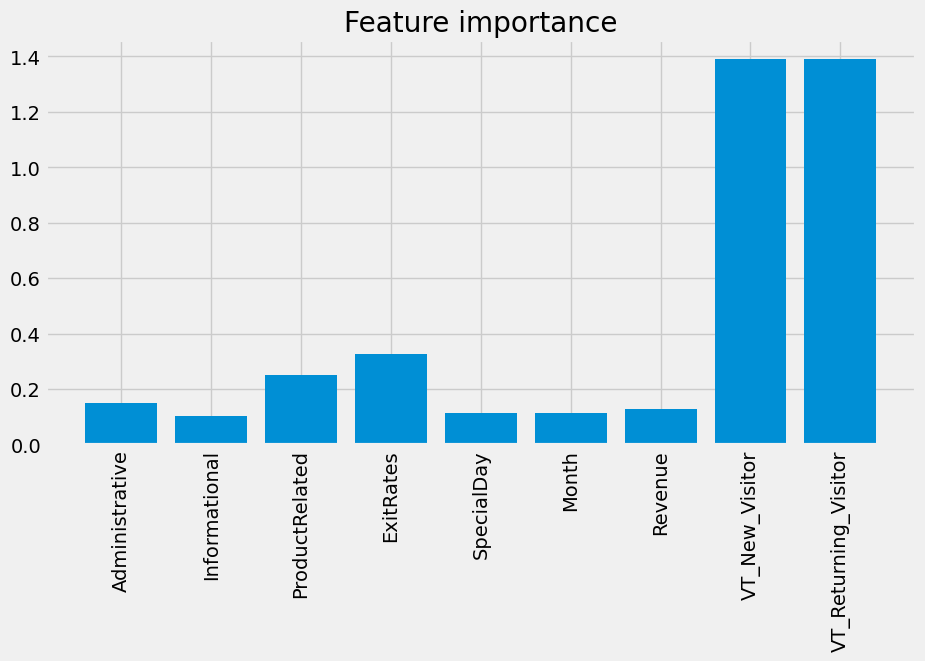

In [54]:
feature_importance = centroids1.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(dataWithImportantColumns.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

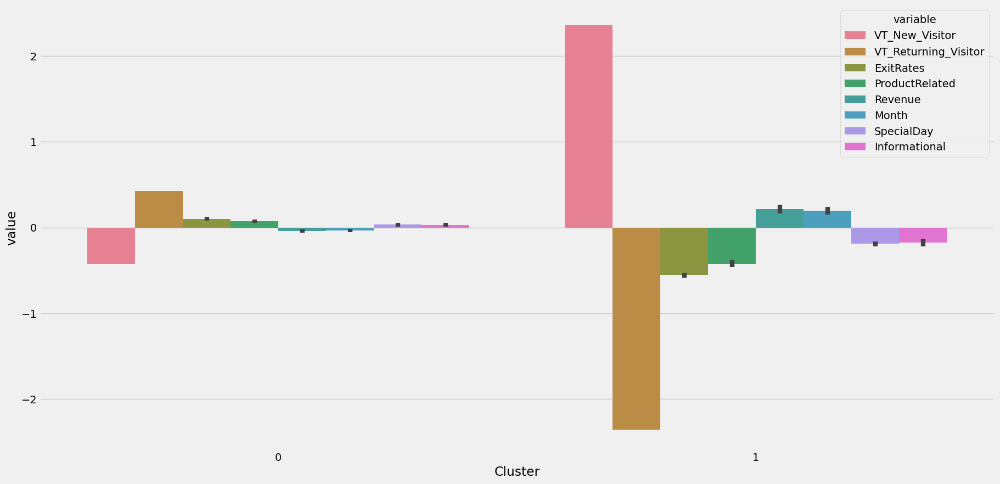

In [55]:
dataWithImportantColumns['Cluster']=cl


plt.figure(figsize=(20, 10))
df_mean = (dataWithImportantColumns.loc[dataWithImportantColumns.Cluster!=-1, :]
                    .groupby('Cluster').mean())
results = pd.DataFrame(columns=['Variable', 'Var'])


for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.var(df_mean[column])]
selected_columns = list(results.sort_values(
        'Var', ascending=False,
    ).head(18).Variable.values) + ['Cluster']
tidy = dataWithImportantColumns[selected_columns].melt(id_vars='Cluster')


sea.barplot(x='Cluster', y='value', hue='variable', data=tidy)
plt.show()
dataWithImportantColumns=dataWithImportantColumns.drop(['Cluster'],axis=1)


### Meanshift

In [56]:
cluster = MeanShift(bandwidth=4.5,n_jobs=4, cluster_all=False)
shift = cluster.fit(descritized_Data)
print(pd.DataFrame(shift.labels_).value_counts(sort=False))
shift.labels_

-1    1951
 0    8854
Name: count, dtype: int64


array([ 0,  0,  0, ..., -1,  0, -1])

In [57]:
ch_score = calinski_harabasz_score(descritized_Data, shift.labels_)
sil_score = silhouette_score(descritized_Data, shift.labels_)
db_score = davies_bouldin_score(descritized_Data, shift.labels_)

print("Calinski-Harabasz score: ", ch_score)
print("Silhouette score: ", sil_score)
print("Davies-Bouldin score: ", db_score)

MeanshiftScore = [['Meanshift', 2, ch_score, sil_score, db_score]]
new_row = pd.DataFrame([dict(zip(columns, MeanshiftScore[0]))])
cluster_results_df = pd.concat([cluster_results_df, new_row], ignore_index=True)

Calinski-Harabasz score:  957.6996583912572
Silhouette score:  0.2163482755991001
Davies-Bouldin score:  2.7827364016742786


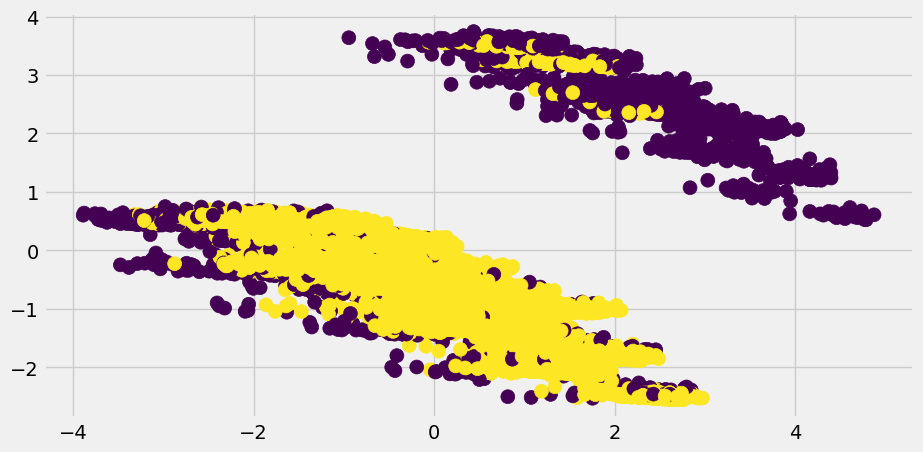

In [58]:
plt.figure(figsize=(10, 5))
plt.scatter(principalComponents['f1'], principalComponents['f2'], c=shift.labels_, cmap='viridis', s=100)
plt.show()


In [59]:
fig = px.scatter_3d(x=principalComponents["f1"], y=principalComponents["f2"], z=principalComponents["f3"], color=shift.labels_)
fig.update_layout(scene=dict(aspectmode="cube"))
fig.update_layout(width=920, height=600)
fig.show()

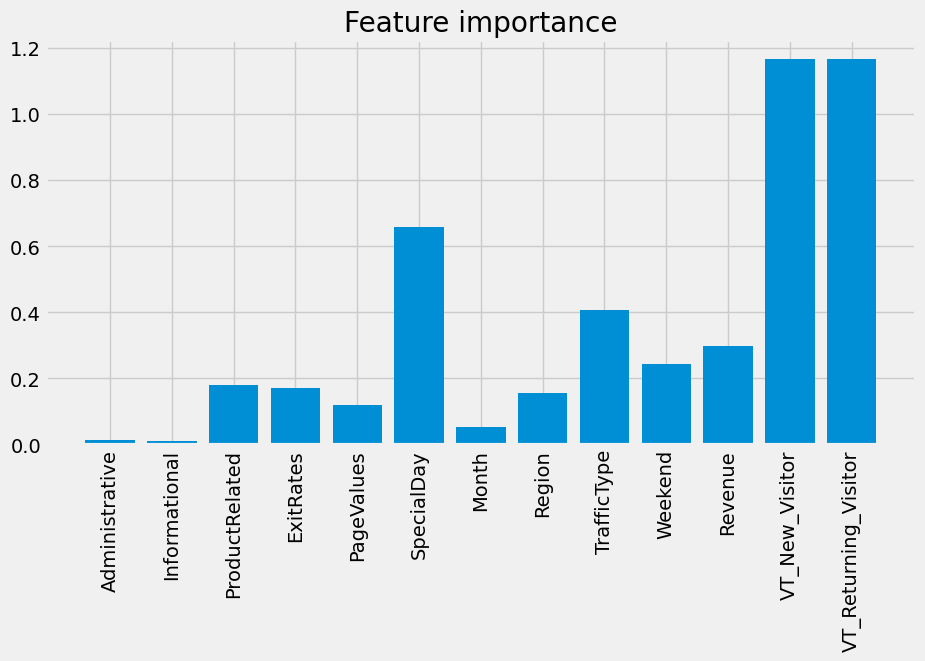

In [60]:
centroids = descritized_Data.groupby(shift.labels_).mean()
feature_importance = centroids.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(descritized_Data.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

#### Drop unimportant features

In [61]:
columnsToDrop =descritized_Data.columns[feature_importance < 0.17]
dataWithImportantColumnsMS = descritized_Data.drop(columns=columnsToDrop)

In [62]:
pca = PCA(n_components=3)
pca.fit(dataWithImportantColumnsMS)
pca_scores1 = pca.fit_transform(dataWithImportantColumnsMS)
pca_scores1.shape
principalComponents4 = pd.DataFrame(pca_scores1, columns=(["f1","f2", "f3"]))
principalComponents4.head()

,f1,f2,f3
0,-0.693988,1.006071,0.761541
1,-0.469188,0.456004,-0.779479
2,-0.715188,0.861637,-0.317905
3,-1.075422,1.644976,-0.789754
4,-0.774136,1.007004,-0.127232


In [63]:
cluster = MeanShift(bandwidth=3.5,n_jobs=4, cluster_all=False)
shift = cluster.fit(dataWithImportantColumnsMS)
print(pd.DataFrame(shift.labels_).value_counts(sort=False))
shift.labels_

-1     914
 0    8295
 1    1596
Name: count, dtype: int64


array([ 0,  0,  0, ..., -1,  0,  1])

In [64]:
ch_score = calinski_harabasz_score(dataWithImportantColumnsMS, shift.labels_)
sil_score = silhouette_score(dataWithImportantColumnsMS, shift.labels_)
db_score = davies_bouldin_score(dataWithImportantColumnsMS, shift.labels_)

print("Calinski-Harabasz score: ", ch_score)
print("Silhouette score: ", sil_score)
print("Davies-Bouldin score: ", db_score)

MeanshiftScore = [['Meanshift with dimensionality reduction', 3, ch_score, sil_score, db_score]]
new_row = pd.DataFrame([dict(zip(columns, MeanshiftScore[0]))])
cluster_results_df = pd.concat([cluster_results_df, new_row], ignore_index=True)

Calinski-Harabasz score:  2672.8347188550797
Silhouette score:  0.38091955537127503
Davies-Bouldin score:  1.7101543209262546


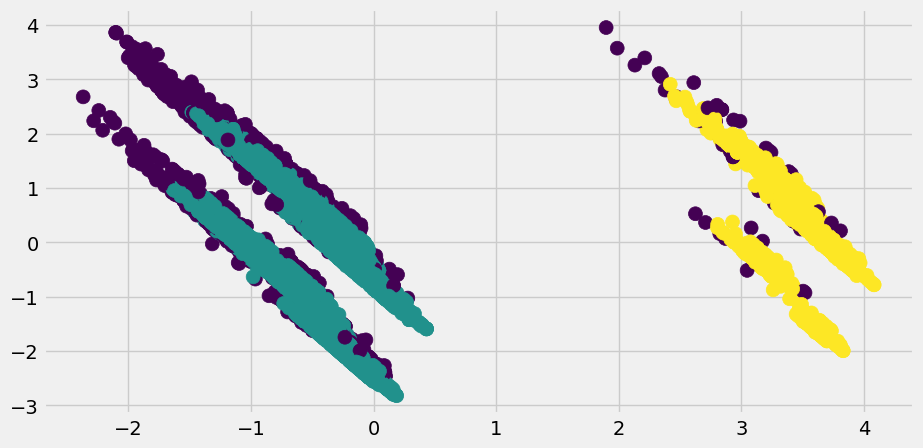

In [65]:
plt.figure(figsize=(10, 5))
plt.scatter(principalComponents4['f1'], principalComponents4['f2'], c=shift.labels_, cmap='viridis', s=100)
plt.show()


In [66]:
fig = px.scatter_3d(x=principalComponents4["f1"], y=principalComponents4["f2"], z=principalComponents4["f3"], color=shift.labels_)
fig.update_layout(scene=dict(aspectmode="cube"))
fig.update_layout(width=920, height=600)
fig.show()

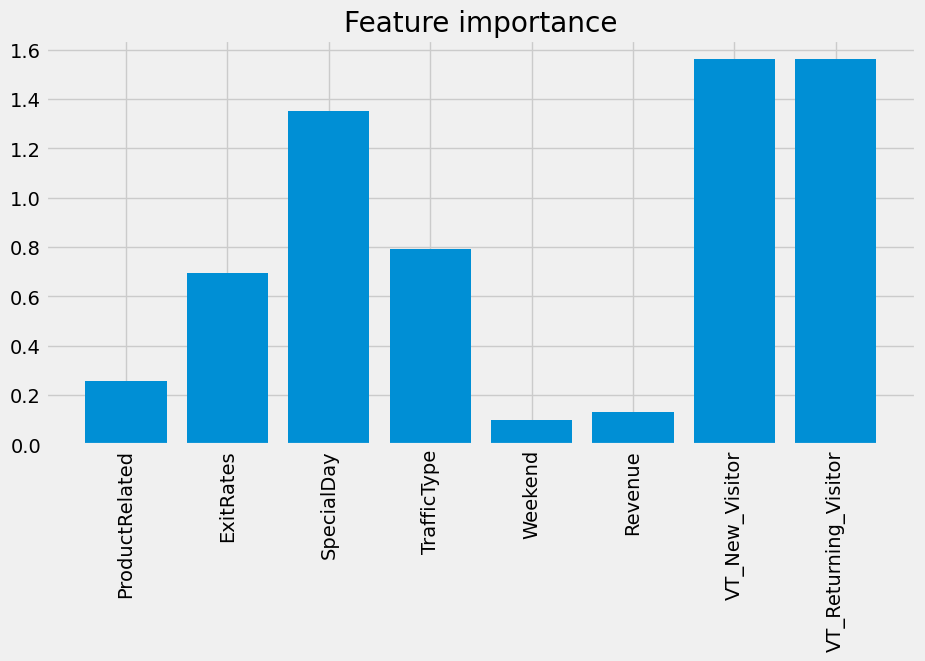

In [67]:
centroids = dataWithImportantColumnsMS.groupby(shift.labels_).mean()
feature_importance = centroids.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(dataWithImportantColumnsMS.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

### DBSCAN

In [68]:
cluster = DBSCAN(n_jobs=4, eps=3.85)
scan = cluster.fit(descritized_Data)

In [69]:
print(pd.DataFrame(scan.labels_).value_counts(sort=False))
scan.labels_

0    9158
1    1647
Name: count, dtype: int64


array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [70]:
ch_score = calinski_harabasz_score(descritized_Data, scan.labels_)
sil_score = silhouette_score(descritized_Data, scan.labels_)
db_score = davies_bouldin_score(descritized_Data, scan.labels_)

print("Calinski-Harabasz score: ", ch_score)
print("Silhouette score: ", sil_score)
print("Davies-Bouldin score: ", db_score)

dbscanScore = [['DBSCAN', 2, ch_score, sil_score, db_score]]
new_row = pd.DataFrame([dict(zip(columns, dbscanScore[0]))])
cluster_results_df = pd.concat([cluster_results_df, new_row], ignore_index=True)

Calinski-Harabasz score:  2116.6734068799333
Silhouette score:  0.25400190137725603
Davies-Bouldin score:  1.5264358103873903


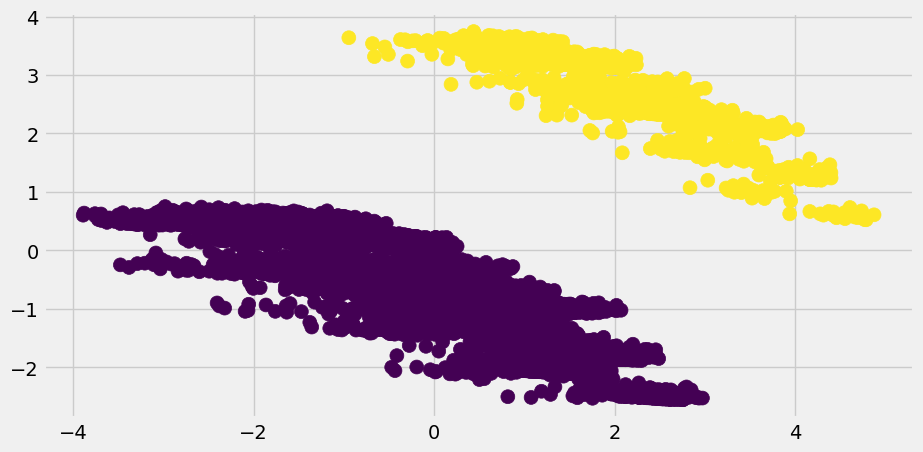

In [71]:
plt.figure(figsize=(10, 5))
plt.scatter(principalComponents['f1'], principalComponents['f2'], c=scan.labels_, cmap='viridis', s=100)
plt.show()

In [72]:
fig = px.scatter_3d(x=principalComponents["f1"], y=principalComponents["f2"], z=principalComponents["f3"], color=scan.labels_)
fig.update_layout(scene=dict(aspectmode="cube"))
fig.update_layout(width=920, height=600)
fig.show()

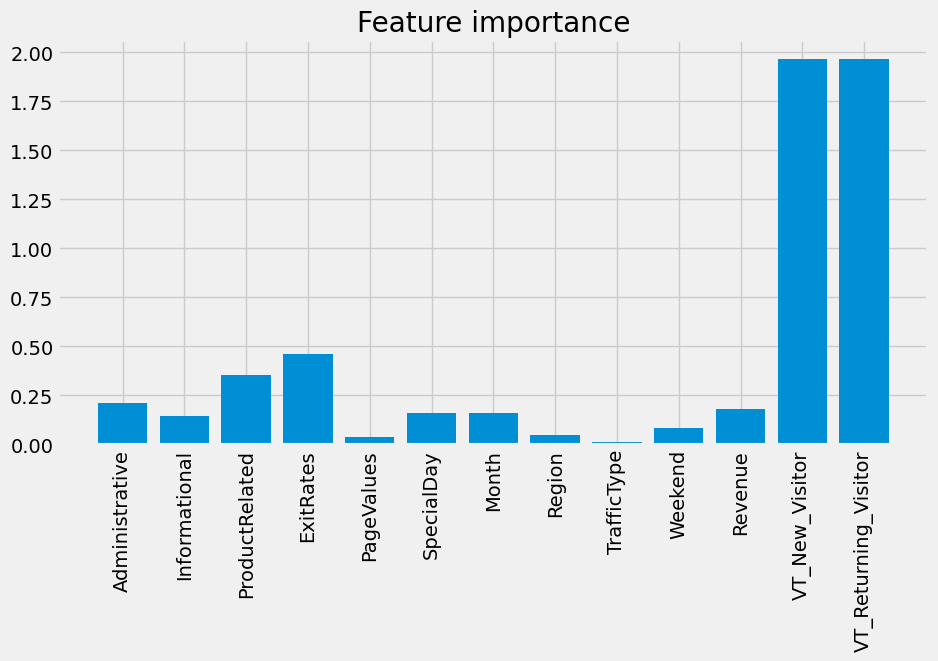

In [73]:
centroids = descritized_Data.groupby(scan.labels_).mean()
feature_importance = centroids.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(descritized_Data.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

##### Drop unimportant features

In [74]:
columnsToDrop =descritized_Data.columns[feature_importance < 0.13]
dataWithImportantColumnsDBSCAN = descritized_Data.drop(columns=columnsToDrop)

In [75]:
pca = PCA(n_components=3)
pca.fit(dataWithImportantColumnsDBSCAN)
pca_scores1 = pca.fit_transform(dataWithImportantColumnsDBSCAN)
pca_scores1.shape
principalComponents5 = pd.DataFrame(pca_scores1, columns=(["f1","f2", "f3"]))
principalComponents5.head()

,f1,f2,f3
0,-1.572298,1.666468,0.216929
1,-1.111243,1.260441,0.435942
2,-1.465008,1.537495,1.763968
3,-1.874369,1.932486,0.073438
4,-1.530457,1.595132,1.732878


In [76]:
cluster = DBSCAN(n_jobs=4, eps=3.85)
scan = cluster.fit(dataWithImportantColumnsDBSCAN)

In [77]:
print(pd.DataFrame(scan.labels_).value_counts(sort=False))
scan.labels_

0    9158
1    1647
Name: count, dtype: int64


array([0, 0, 0, ..., 0, 0, 1], dtype=int64)

In [78]:
ch_score = calinski_harabasz_score(dataWithImportantColumnsDBSCAN, scan.labels_)
sil_score = silhouette_score(dataWithImportantColumnsDBSCAN, scan.labels_)
db_score = davies_bouldin_score(dataWithImportantColumnsDBSCAN, scan.labels_)

print("Calinski-Harabasz score: ", ch_score)
print("Silhouette score: ", sil_score)
print("Davies-Bouldin score: ", db_score)

dbscanScore = [['DBSCAN with dimensionality reduction', 2, ch_score, sil_score, db_score]]
new_row = pd.DataFrame([dict(zip(columns, dbscanScore[0]))])
cluster_results_df = pd.concat([cluster_results_df, new_row], ignore_index=True)

Calinski-Harabasz score:  3342.854285352134
Silhouette score:  0.34537589223508985
Davies-Bouldin score:  1.183525815992476


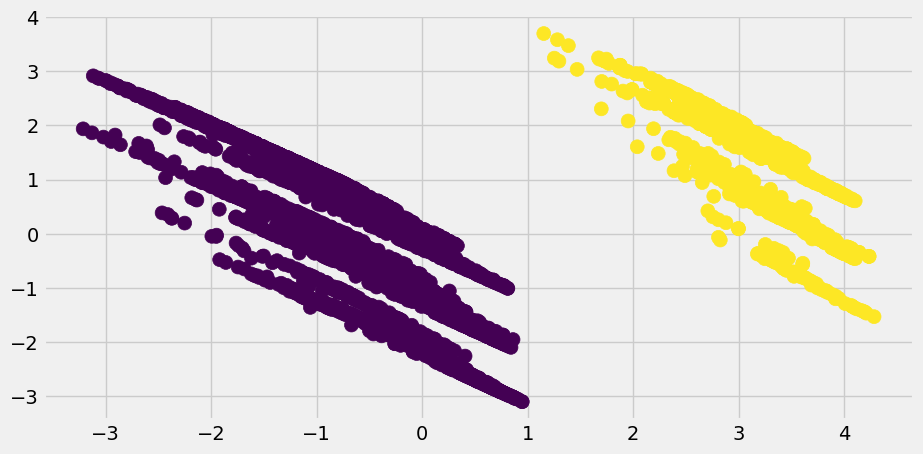

In [79]:
plt.figure(figsize=(10, 5))
plt.scatter(principalComponents5['f1'], principalComponents5['f2'], c=scan.labels_, cmap='viridis', s=100)
plt.show()

In [80]:
fig = px.scatter_3d(x=principalComponents5["f1"], y=principalComponents5["f2"], z=principalComponents5["f3"], color=scan.labels_)
fig.update_layout(scene=dict(aspectmode="cube"))
fig.update_layout(width=920, height=600)
fig.show()

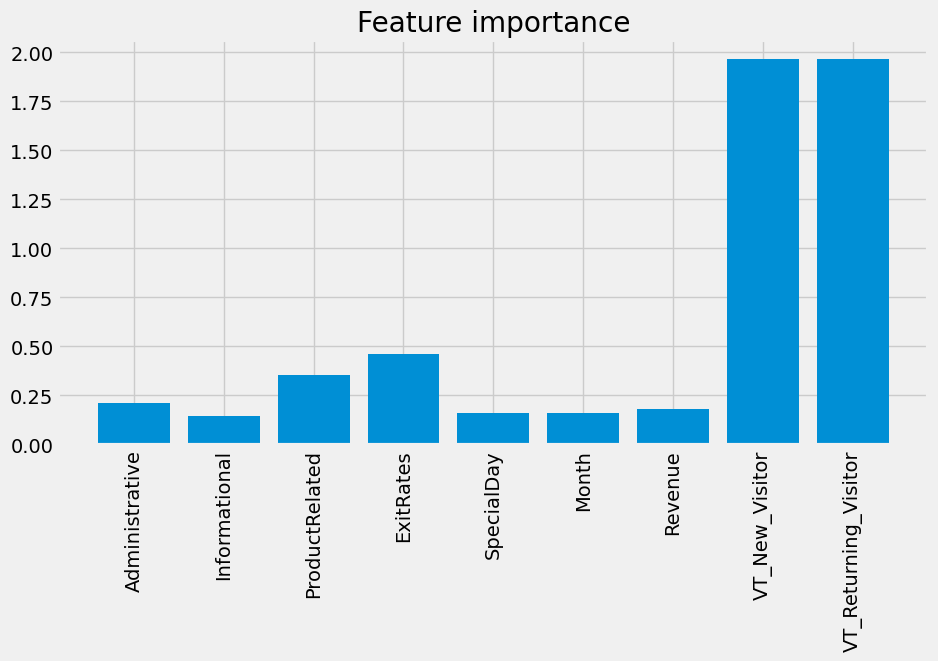

In [81]:
centroids = dataWithImportantColumnsDBSCAN.groupby(scan.labels_).mean()
feature_importance = centroids.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(dataWithImportantColumnsDBSCAN.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

## Overlapping Clustering

## Hierarhical clustering

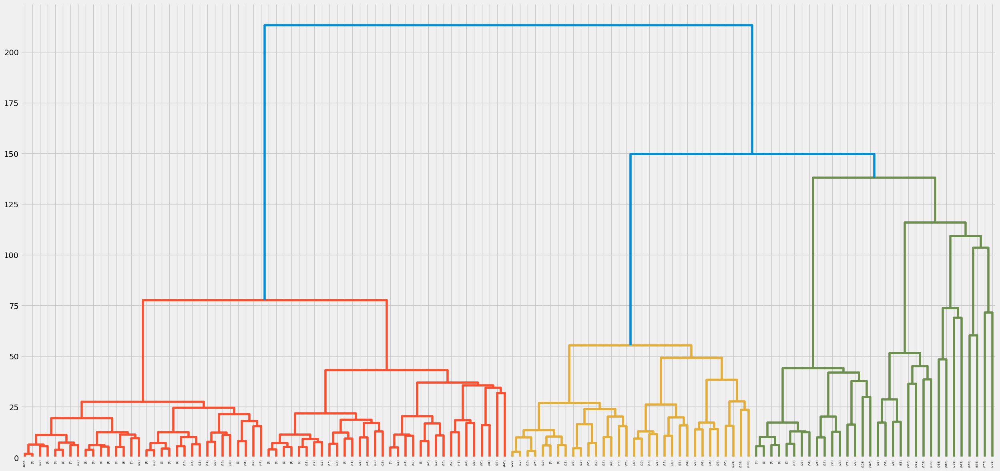

In [82]:
dendrogram = sch.dendrogram(sch.linkage(descritized_Data, method = 'ward'), truncate_mode='level', p=6)
plt.show()

#### Aglomerative Clustering

In [83]:
ac_model = AgglomerativeClustering(n_clusters=2).fit(descritized_Data)
ac_labels = ac_model.fit_predict(descritized_Data)
sil_score = silhouette_score(descritized_Data, ac_labels)
ch_score = calinski_harabasz_score(descritized_Data, ac_labels)
db_score = davies_bouldin_score(descritized_Data, ac_labels)
print("Clusters: 2" )
print(ac_labels)
print("calinski_harabasz_score", ch_score )
print("Silhouette score: ", sil_score)
print("Davies-Bouldin score: ", db_score)

ac_model1 = AgglomerativeClustering(n_clusters=3).fit(descritized_Data)
ac_labels1 = ac_model1.fit_predict(descritized_Data)
print("\nClusters: 3",)
print(ac_labels1)
print("calinski_harabasz_score", calinski_harabasz_score(descritized_Data, ac_labels1))
print("Silhouette score: ", silhouette_score(descritized_Data, ac_labels1))
print("Davies-Bouldin score: ", davies_bouldin_score(descritized_Data, ac_labels1))

ac_model2 = AgglomerativeClustering(n_clusters=4).fit(descritized_Data)
ac_labels2 = ac_model2.fit_predict(descritized_Data)
print("\nClusters: 4")
print(ac_labels2)
print("calinski_harabasz_score", calinski_harabasz_score(descritized_Data, ac_labels2))
print("Silhouette score: ", silhouette_score(descritized_Data, ac_labels2))
print("Davies-Bouldin score: ", davies_bouldin_score(descritized_Data, ac_labels2))

Clusters: 2
[0 0 0 ... 0 0 1]
calinski_harabasz_score 2084.6462563822665
Silhouette score:  0.25148905439060254
Davies-Bouldin score:  1.5244453906799016

Clusters: 3
[0 0 0 ... 0 0 1]
calinski_harabasz_score 1719.738046848663
Silhouette score:  0.19023112095425787
Davies-Bouldin score:  1.7213123023779993

Clusters: 4
[0 0 3 ... 0 0 1]
calinski_harabasz_score 1612.9319601712523
Silhouette score:  0.1993118215735069
Davies-Bouldin score:  1.6775936271492493


In [84]:
algclScore = [['Agglomerative Clustering', 2, ch_score, sil_score, db_score]]
new_row = pd.DataFrame([dict(zip(columns, algclScore[0]))])
cluster_results_df = pd.concat([cluster_results_df, new_row], ignore_index=True)

In [85]:
unique, counts = np.unique(ac_labels, return_counts=True)
counts = counts.reshape(1,2)
countscldf = pd.DataFrame(counts, columns = ["Cluster 0","Cluster 1"])

countscldf

,Cluster 0,Cluster 1
0,9176,1629


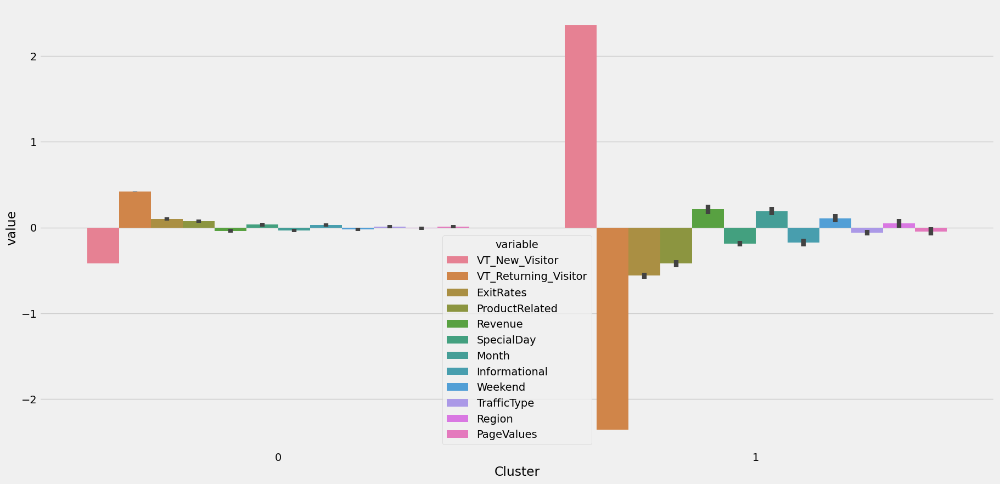

In [86]:
descritized_Data['Cluster']=ac_labels


plt.figure(figsize=(20, 10))
df_mean = (descritized_Data.loc[descritized_Data.Cluster!=-1, :]
                    .groupby('Cluster').mean())
results = pd.DataFrame(columns=['Variable', 'Var'])


for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.var(df_mean[column])]
selected_columns = list(results.sort_values(
        'Var', ascending=False,
    ).head(18).Variable.values) + ['Cluster']
tidy = descritized_Data[selected_columns].melt(id_vars='Cluster')


sea.barplot(x='Cluster', y='value', hue='variable', data=tidy)
plt.show()

descritized_Data=descritized_Data.drop(['Cluster'],axis=1)

In [87]:
fig = px.scatter_3d(principalComponents, principalComponents['f2'], principalComponents['f1'], principalComponents['f3'], color=ac_labels,labels={'x': 'C1', 'y': 'C2', 'z': 'C3'})
fig.update_layout(scene=dict(aspectmode="cube"))
fig.update_layout(width=920, height=600)

fig.show()

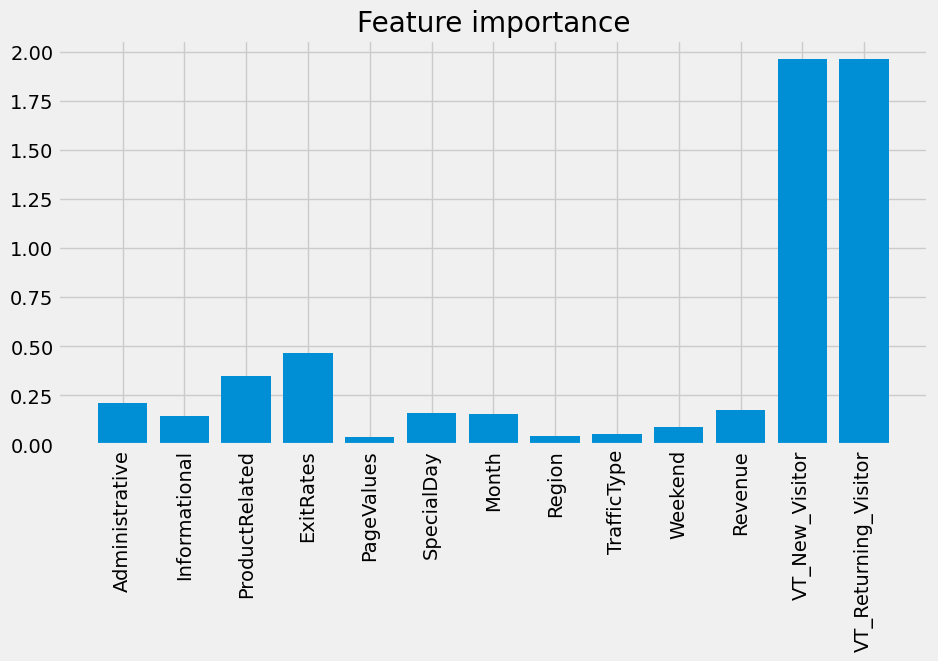

In [88]:
centroids = descritized_Data.groupby(ac_labels).mean()
feature_importance = centroids.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(descritized_Data.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

##### Drop unimportant features


In [89]:
columnsToDrop =descritized_Data.columns[feature_importance < 0.15]
dataWithImportantColumnsAC = descritized_Data.drop(columns=columnsToDrop)


In [90]:
pca = PCA(n_components=3)
pca.fit(dataWithImportantColumnsAC)
pca_scores1 = pca.fit_transform(dataWithImportantColumnsAC)
pca_scores1.shape
principalComponents2 = pd.DataFrame(pca_scores1, columns=(["f1","f2", "f3"]))
principalComponents2.head()

,f1,f2,f3
0,-1.489974,1.666101,0.069187
1,-1.043758,1.175755,0.414422
2,-1.389240,1.580647,1.729100
3,-1.782322,1.987362,-0.157001
4,-1.452582,1.650254,1.680093


In [91]:
ac_model1 = AgglomerativeClustering(n_clusters=2).fit(dataWithImportantColumnsAC)
ac_labels1 = ac_model1.fit_predict(dataWithImportantColumnsAC)

print("\nClusters: 2",)
print(ac_labels1)
print("calinski_harabasz_score", calinski_harabasz_score(dataWithImportantColumnsAC, ac_labels1))
print("Silhouette score: ", silhouette_score(dataWithImportantColumnsAC, ac_labels1))
print("Davies-Bouldin score: ", davies_bouldin_score(dataWithImportantColumnsAC, ac_labels1))

ac_model2 = AgglomerativeClustering(n_clusters=3).fit(dataWithImportantColumnsAC)
ac_labels2 = ac_model2.fit_predict(dataWithImportantColumnsAC)
sil_score = silhouette_score(dataWithImportantColumnsAC, ac_labels2)
db_score = davies_bouldin_score(dataWithImportantColumnsAC, ac_labels2)
ch_score =calinski_harabasz_score(dataWithImportantColumnsAC, ac_labels2)
print("\nClusters: 3",)
print(ac_labels2)
print("calinski_harabasz_score", ch_score)
print("Silhouette score: ", sil_score)
print("Davies-Bouldin score: ", db_score)

ac_model3 = AgglomerativeClustering(n_clusters=4).fit(dataWithImportantColumnsAC)
ac_labels3 = ac_model3.fit_predict(dataWithImportantColumnsAC)
print("\nClusters: 4",)
print(ac_labels3)
print("calinski_harabasz_score", calinski_harabasz_score(dataWithImportantColumnsAC, ac_labels3))
print("Silhouette score: ", silhouette_score(dataWithImportantColumnsAC, ac_labels3))
print("Davies-Bouldin score: ", davies_bouldin_score(dataWithImportantColumnsAC, ac_labels3))



Clusters: 2
[0 0 0 ... 0 0 1]
calinski_harabasz_score 3897.9606747380612
Silhouette score:  0.38218016378430153
Davies-Bouldin score:  1.090425272013404

Clusters: 3
[0 0 2 ... 0 0 1]
calinski_harabasz_score 3270.153649141796
Silhouette score:  0.3658856418584031
Davies-Bouldin score:  1.1518862086734039

Clusters: 4
[0 0 2 ... 0 0 1]
calinski_harabasz_score 3319.1338906594565
Silhouette score:  0.3157408178466196
Davies-Bouldin score:  1.2058855594666187


In [92]:
algclPCAScore = [['Agglomerative Clustering with dimensionality reduction', 2, ch_score, sil_score, db_score]]
new_row = pd.DataFrame([dict(zip(columns, algclPCAScore[0]))])
cluster_results_df = pd.concat([cluster_results_df, new_row], ignore_index=True)

In [93]:
unique, counts = np.unique(ac_labels1, return_counts=True)
counts = counts.reshape(1,2)
countscldf = pd.DataFrame(counts, columns = ["Cluster 0","Cluster 1"])


In [94]:
fig = px.scatter_3d(principalComponents2, principalComponents2['f2'], principalComponents2['f1'], principalComponents2['f3'], color=ac_labels1,labels={'x': 'C1', 'y': 'C2', 'z': 'C3'})
fig.update_layout(scene=dict(aspectmode="cube"))
fig.update_layout(width=920, height=600)

fig.show()

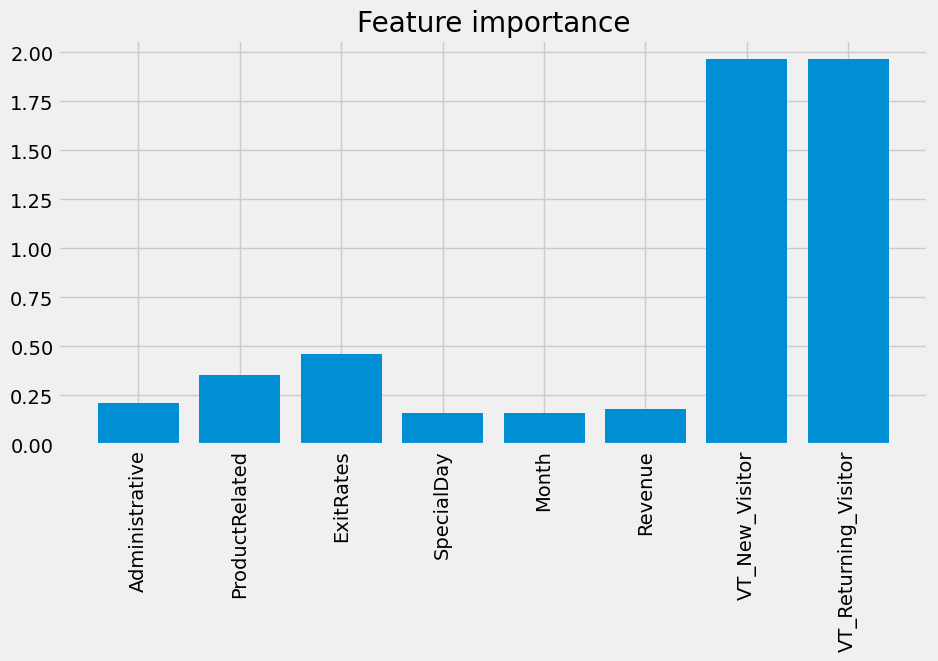

In [95]:
centroids = dataWithImportantColumnsAC.groupby(ac_labels1).mean()
feature_importance = centroids.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(dataWithImportantColumnsAC.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

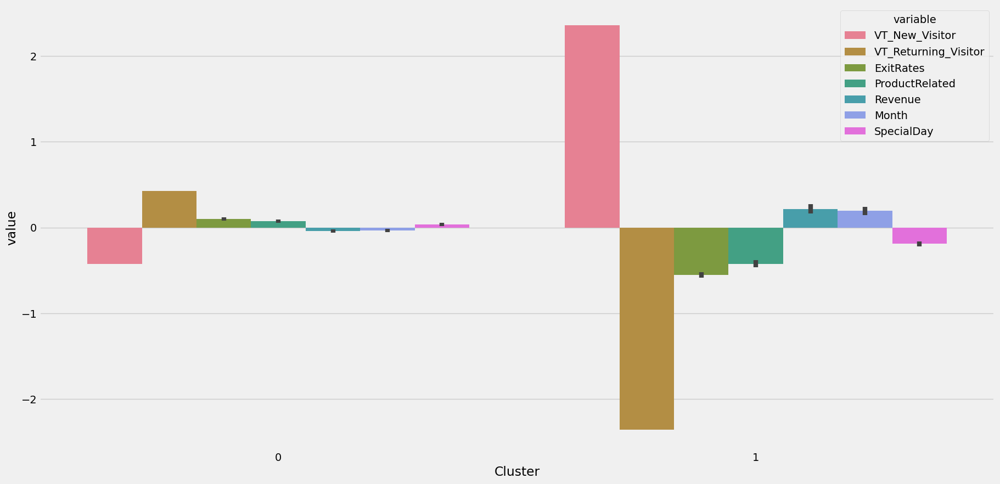

In [96]:
dataWithImportantColumnsAC['Cluster']=ac_labels1


plt.figure(figsize=(20, 10))
df_mean = (dataWithImportantColumnsAC.loc[dataWithImportantColumnsAC.Cluster!=-1, :]
                    .groupby('Cluster').mean())
results = pd.DataFrame(columns=['Variable', 'Var'])


for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.var(df_mean[column])]
selected_columns = list(results.sort_values(
        'Var', ascending=False,
    ).head(18).Variable.values) + ['Cluster']
tidy = dataWithImportantColumnsAC[selected_columns].melt(id_vars='Cluster')


sea.barplot(x='Cluster', y='value', hue='variable', data=tidy)
plt.show()

dataWithImportantColumnsAC=dataWithImportantColumnsAC.drop(['Cluster'],axis=1)

## Probabilistic Clustering

### Gaussian Mixture Model

In [97]:
gm_pca_model =  mixture.GaussianMixture(n_components=2)
gm_pca_labels = gm_pca_model.fit_predict(descritized_Data)

sil_score = silhouette_score(descritized_Data, gm_pca_labels)
ch_score =  calinski_harabasz_score(descritized_Data, gm_pca_labels)
db_score = davies_bouldin_score(descritized_Data, gm_pca_labels)

print("clusters: 2" )
print(gm_pca_labels)
print("calinski_harabasz_score", ch_score)
print("Silhouette score: ", sil_score)
print("Davies-Bouldin score: ", db_score )

gm_pca_model1 =  mixture.GaussianMixture(n_components=3).fit(descritized_Data)
gm_pca_labels1 = gm_pca_model1.fit_predict(descritized_Data)

sil_score3 = silhouette_score(descritized_Data, gm_pca_labels1)
ch_score3 =  calinski_harabasz_score(descritized_Data, gm_pca_labels1)
db_score3 = davies_bouldin_score(descritized_Data, gm_pca_labels1)
print("\nclusters: 3")
print(gm_pca_labels1)
print("calinski_harabasz_score", ch_score3)
print("Silhouette score: ", sil_score3)
print("Davies-Bouldin score: ", db_score3)

gm_pca_model2 =  mixture.GaussianMixture(n_components=4).fit(descritized_Data)
gm_pca_labels2 = gm_pca_model2.fit_predict(descritized_Data)
   
print("\nclusters: 4")
print(gm_pca_labels2)
print("calinski_harabasz_score", calinski_harabasz_score(descritized_Data, gm_pca_labels2))
print("Silhouette score: ", silhouette_score(descritized_Data, gm_pca_labels2))
print("Davies-Bouldin score: ", davies_bouldin_score(descritized_Data, gm_pca_labels2))

clusters: 2
[0 0 0 ... 0 0 1]
calinski_harabasz_score 2116.6734068799333
Silhouette score:  0.25400190137725603
Davies-Bouldin score:  1.5264358103873903

clusters: 3
[0 0 0 ... 0 0 1]
calinski_harabasz_score 2025.2442740008719
Silhouette score:  0.19867883815682214
Davies-Bouldin score:  1.872632234034304

clusters: 4
[2 2 3 ... 2 2 2]
calinski_harabasz_score 1155.5105175151107
Silhouette score:  0.1288129969112462
Davies-Bouldin score:  2.1615702474675773


In [98]:
GaussianMixtureScore = [['GaussianMixture', 3, ch_score3, sil_score3, db_score3]]
new_row = pd.DataFrame([dict(zip(columns, GaussianMixtureScore[0]))])
cluster_results_df = pd.concat([cluster_results_df, new_row], ignore_index=True)

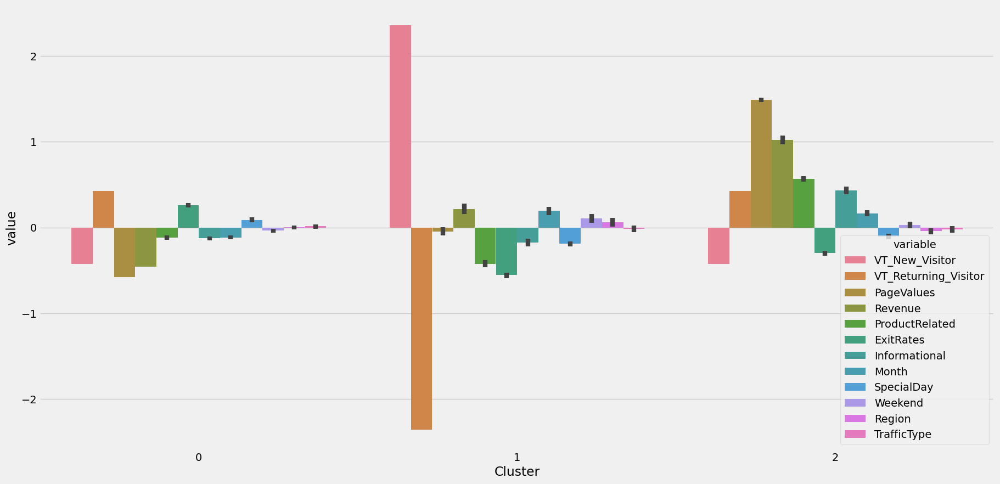

In [99]:
descritized_Data['Cluster']=gm_pca_labels1


plt.figure(figsize=(20, 10))
df_mean = (descritized_Data.loc[descritized_Data.Cluster!=-1, :]
                    .groupby('Cluster').mean())
results = pd.DataFrame(columns=['Variable', 'Var'])


for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.var(df_mean[column])]
selected_columns = list(results.sort_values(
        'Var', ascending=False,
    ).head(15).Variable.values) + ['Cluster']
tidy = descritized_Data[selected_columns].melt(id_vars='Cluster')


sea.barplot(x='Cluster', y='value', hue='variable', data=tidy)
plt.show()

descritized_Data=descritized_Data.drop(['Cluster'],axis=1)

In [100]:
fig = px.scatter_3d(x=principalComponents["f1"], y=principalComponents["f2"], z=principalComponents["f3"], color=gm_pca_labels1)
fig.update_layout(scene=dict(aspectmode="cube"))
fig.update_layout(width=920, height=600)
fig.show()


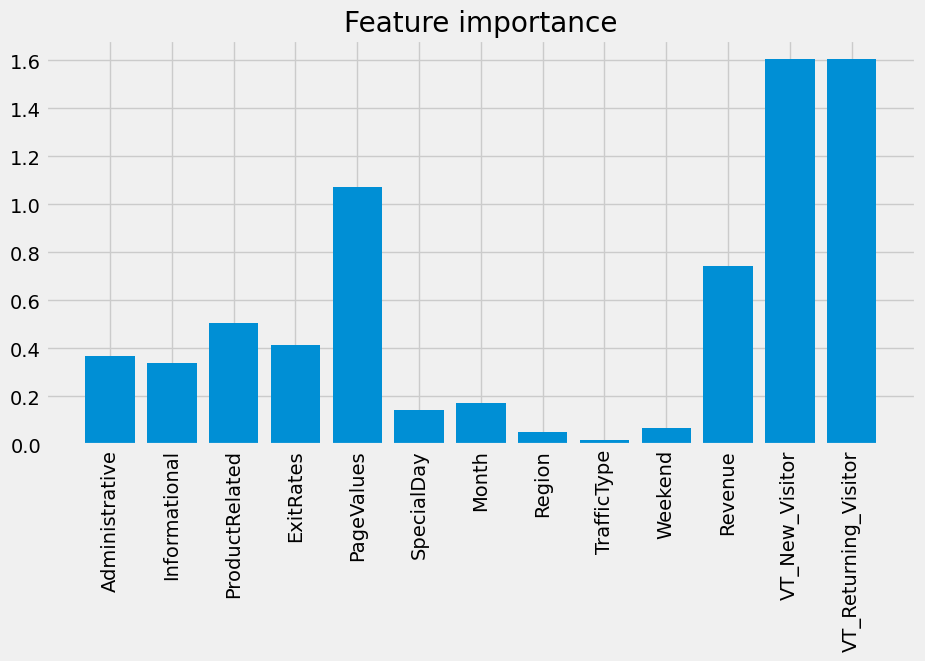

In [101]:
centroids = descritized_Data.groupby(gm_pca_labels1).mean()
feature_importance = centroids.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(descritized_Data.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

##### Dropping unimportant fetures

In [102]:
columnsToDrop =descritized_Data.columns[feature_importance < 0.35]
dataWithImportantColumns3 = descritized_Data.drop(columns=columnsToDrop)


In [103]:
pca = PCA(n_components=3)
pca.fit(dataWithImportantColumns3)
pca_scores1 = pca.fit_transform(dataWithImportantColumns3)
pca_scores1.shape
principalComponents3 = pd.DataFrame(pca_scores1, columns=(["f1","f2", "f3"]))
principalComponents3.head()

,f1,f2,f3
0,-1.681887,0.985165,0.787430
1,-1.160587,0.741279,0.314652
2,-1.112651,0.718853,0.271178
3,-2.023428,1.144952,1.097181
4,-1.186652,0.753474,0.338291


In [104]:
gm_pca_model =  mixture.GaussianMixture(n_components=2)
gm_pca_labels = gm_pca_model.fit_predict(dataWithImportantColumns3)
print("clusters: 2" )
print(gm_pca_labels)
print("calinski_harabasz_score", calinski_harabasz_score(dataWithImportantColumns3, gm_pca_labels))
print("Silhouette score: ", silhouette_score(dataWithImportantColumns3, gm_pca_labels))
print("Davies-Bouldin score: ", davies_bouldin_score(dataWithImportantColumns3, gm_pca_labels))


gm_pca_model1 =  mixture.GaussianMixture(n_components=3).fit(dataWithImportantColumns3)
gm_pca_labels1 = gm_pca_model1.fit_predict(dataWithImportantColumns3)
sil_score3 = silhouette_score(dataWithImportantColumns3, gm_pca_labels2)
ch_score3 = calinski_harabasz_score(dataWithImportantColumns3, gm_pca_labels2)
db_score3 =  davies_bouldin_score(dataWithImportantColumns3, gm_pca_labels2)   
print("\nclusters: 3")
print(gm_pca_labels1)
print("calinski_harabasz_score", ch_score3)
print("Silhouette score: ",sil_score3)
print("Davies-Bouldin score: ", db_score3)


gm_pca_model2 =  mixture.GaussianMixture(n_components=4).fit(dataWithImportantColumns3)
gm_pca_labels2 = gm_pca_model2.fit_predict(dataWithImportantColumns3)

sil_score4 = silhouette_score(dataWithImportantColumns3, gm_pca_labels2)
ch_score4 = calinski_harabasz_score(dataWithImportantColumns3, gm_pca_labels2)
db_score4 =  davies_bouldin_score(dataWithImportantColumns3, gm_pca_labels2)
print("\nclusters: 4")
print(gm_pca_labels2)
print("calinski_harabasz_score", ch_score4)
print("Silhouette score: ", sil_score4)
print("Davies-Bouldin score: ", db_score4)

clusters: 2
[1 1 1 ... 1 1 0]
calinski_harabasz_score 4655.8264826688555


Silhouette score:  0.42874157007563046
Davies-Bouldin score:  1.0150592001720455

clusters: 3
[1 1 1 ... 1 1 1]
calinski_harabasz_score 1279.4324057411402
Silhouette score:  0.0677499395558515
Davies-Bouldin score:  4.040585677075915

clusters: 4
[0 0 0 ... 0 0 3]
calinski_harabasz_score 5202.589741510344
Silhouette score:  0.3680055232440083
Davies-Bouldin score:  1.1524884900458479


In [105]:
GaussianMixtureScorePCA = [['GaussianMixture with dimensionality reduction', 3, ch_score3, sil_score3, db_score3]]
new_row = pd.DataFrame([dict(zip(columns, GaussianMixtureScorePCA[0]))])
cluster_results_df = pd.concat([cluster_results_df, new_row], ignore_index=True)

In [106]:
fig = px.scatter_3d(x=principalComponents3["f1"], y=principalComponents3["f2"], z=principalComponents3["f3"], color=gm_pca_labels1)
fig.update_layout(scene=dict(aspectmode="cube"))
fig.update_layout(width=920, height=600)
fig.show()

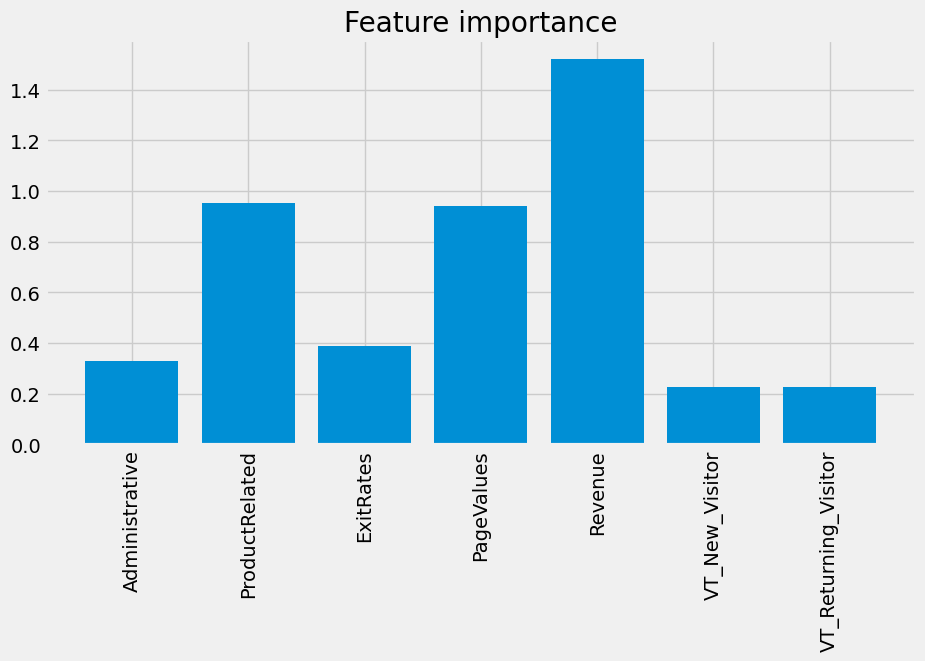

In [107]:
centroids = dataWithImportantColumns3.groupby(gm_pca_labels1).mean()
feature_importance = centroids.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(dataWithImportantColumns3.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()


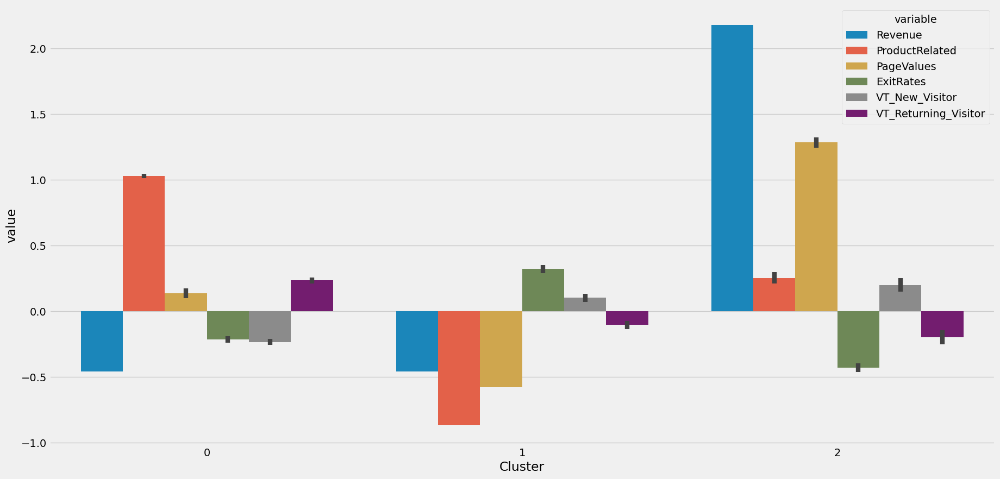

In [108]:
dataWithImportantColumns3['Cluster']=gm_pca_labels1

plt.figure(figsize=(20, 10))
df_mean = (dataWithImportantColumns3.loc[dataWithImportantColumns3.Cluster!=-1, :]
                    .groupby('Cluster').mean())
results = pd.DataFrame(columns=['Variable', 'Var'])


for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.var(df_mean[column])]
selected_columns = list(results.sort_values(
        'Var', ascending=False,
    ).head(18).Variable.values) + ['Cluster']
tidy = dataWithImportantColumns3[selected_columns].melt(id_vars='Cluster')


sea.barplot(x='Cluster', y='value', hue='variable', data=tidy)
plt.show()


dataWithImportantColumns3=dataWithImportantColumns3.drop(['Cluster'],axis=1)

# Overview of all algorithms

In [109]:
display(cluster_results_df)

,algorithm,number of clusters,calinski_harabasz_score,silhouette_score,davies_bouldin_score
0,KMeans,2,2116.673407,0.254002,1.526436
1,KMeans with dimensionality reduction,2,3342.854285,0.345376,1.183526
2,Meanshift,2,957.699658,0.216348,2.782736
3,Meanshift with dimensionality reduction,3,2672.834719,0.380920,1.710154
4,DBSCAN,2,2116.673407,0.254002,1.526436
5,DBSCAN with dimensionality reduction,2,3342.854285,0.345376,1.183526
6,Agglomerative Clustering,2,2084.646256,0.251489,1.524445
7,Agglomerative Clustering with dimensionality r...,2,3270.153649,0.365886,1.151886
8,GaussianMixture,3,2025.244274,0.198679,1.872632
9,GaussianMixture with dimensionality reduction,3,1279.432406,0.067750,4.040586


# Conclusion

In [110]:
kmeans_pca = KMeans(n_clusters=2, init='k-means++', random_state=0)
clusters=kmeans_pca.fit_predict(dataWithImportantColumns)
centroids1=kmeans_pca.cluster_centers_
fig1 = px.scatter_3d(dataWithImportantColumns, x=principalComponents1['f1'], y=principalComponents1['f2'], z=principalComponents1['f3'], color=clusters,
                     labels={'x': 'C1 ', 'y': 'C2', 'z': 'C3'},
                     title="2 Clusters by PCA Components")
fig1.update_layout(scene=dict(aspectmode="cube"))
fig1.update_layout(width=920, height=600)

fig1.show()

c:\Users\Sokol\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



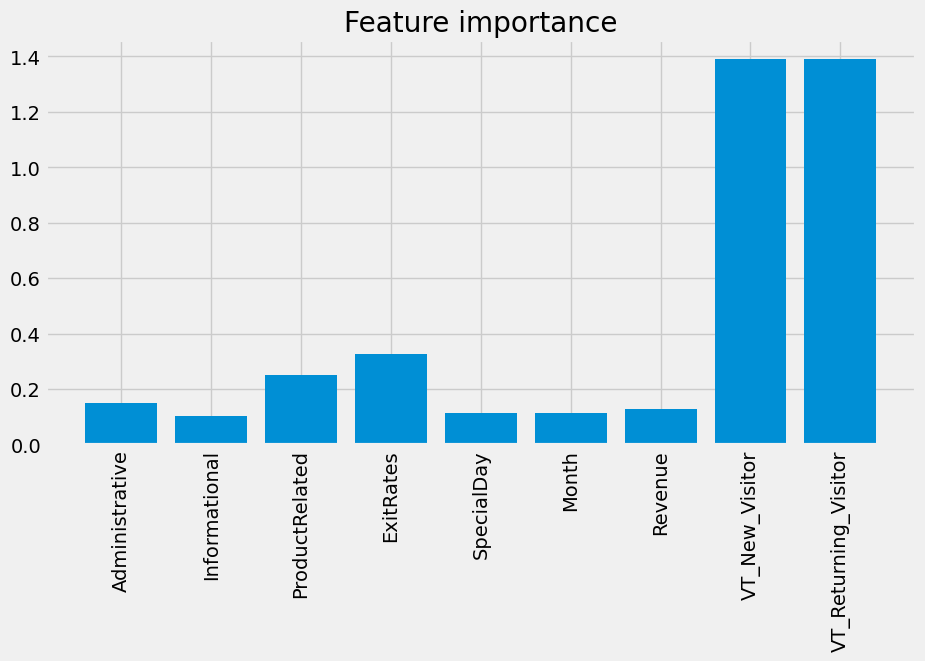

In [111]:
feature_importance = centroids1.std(axis=0)
plt.figure(figsize=(10, 5))
plt.bar(dataWithImportantColumns.columns, feature_importance)
plt.xticks(rotation=90)
plt.title('Feature importance')
plt.show()

In [112]:
dataWithImportantColumns['Cluster']=clusters
dataWithImportantColumns.head()

,Administrative,Informational,ProductRelated,ExitRates,SpecialDay,Month,Revenue,VT_New_Visitor,VT_Returning_Visitor,Cluster
0,-1.217923,-0.563063,-0.866727,1.141819,-0.294800,-1.701567,-0.459551,-0.424079,0.424079,0
1,-1.217923,-0.563063,-0.866727,-0.152383,-0.294800,-1.701567,-0.459551,-0.424079,0.424079,0
2,-1.217923,-0.563063,-0.866727,-0.271390,1.788466,-1.701567,-0.459551,-0.424079,0.424079,0
3,-1.217923,-0.563063,-0.866727,1.989744,-0.294800,-1.701567,-0.459551,-0.424079,0.424079,0
4,-1.217923,-0.563063,-0.866727,-0.087673,1.788466,-1.701567,-0.459551,-0.424079,0.424079,0


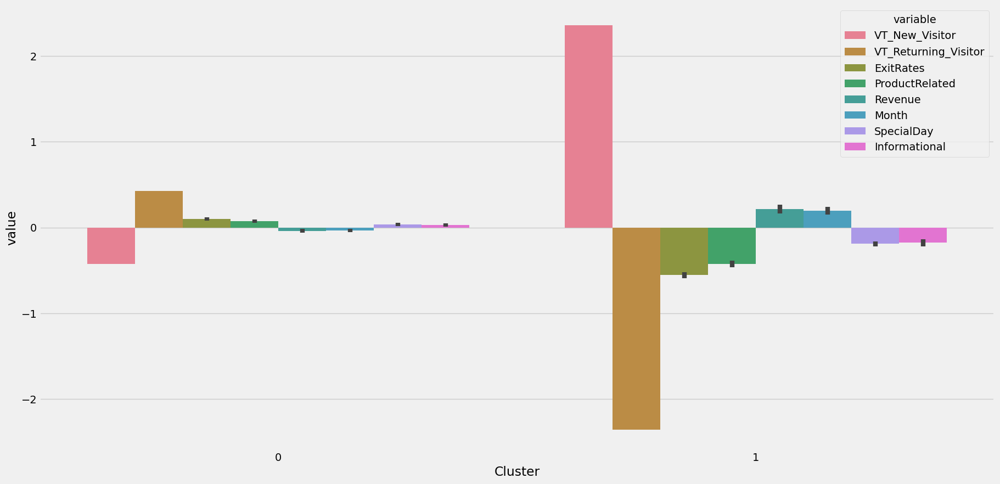

In [113]:
plt.figure(figsize=(20, 10))
df_mean = (dataWithImportantColumns.loc[dataWithImportantColumns.Cluster!=-1, :]
                    .groupby('Cluster').mean())
results = pd.DataFrame(columns=['Variable', 'Var'])


for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.var(df_mean[column])]
selected_columns = list(results.sort_values(
        'Var', ascending=False,
    ).head(10).Variable.values) + ['Cluster']
tidy = dataWithImportantColumns[selected_columns].melt(id_vars='Cluster')


sea.barplot(x='Cluster', y='value', hue='variable', data=tidy)
plt.show()
dataWithImportantColumns=dataWithImportantColumns.drop(['Cluster'],axis=1)

In [114]:
dataWithImportantColumnsUnscaled = data_unscaled[dataWithImportantColumns.columns]
dataWithImportantColumnsUnscaled['Cluster'] = clusters
dataWithImportantColumnsUnscaled.head()

C:\Users\Sokol\AppData\Local\Temp\ipykernel_4588\3088371365.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Administrative,Informational,ProductRelated,ExitRates,SpecialDay,Month,Revenue,VT_New_Visitor,VT_Returning_Visitor,Cluster
0,0,0,0,0.050000,0.0,2,0,0,1,0
1,0,0,0,0.024561,0.0,2,0,0,1,0
2,0,0,0,0.022222,0.4,2,0,0,1,0
3,0,0,0,0.066667,0.0,2,0,0,1,0
4,0,0,0,0.025833,0.4,2,0,0,1,0


In [115]:
# Spajanje kolona 'VT_New_Visitor' i 'VT_Returning_Visitor' u jednu kolonu 'Visitor_Type'
dataWithImportantColumnsUnscaled['Visitor_Type'] = dataWithImportantColumnsUnscaled[['VT_New_Visitor', 'VT_Returning_Visitor']].idxmax(axis=1).str.replace('VT_', '')

# Brisanje originalnih kolona 'VT_New_Visitor' i 'VT_Returning_Visitor'
dataWithImportantColumnsUnscaled = dataWithImportantColumnsUnscaled.drop(['VT_New_Visitor', 'VT_Returning_Visitor'], axis=1)

# Mapiranje 'Revenue' kolone
dataWithImportantColumnsUnscaled['Revenue'] = dataWithImportantColumnsUnscaled['Revenue'].map({1: True, 0: False})

# Mapiranje 'Administrative' kolone
dataWithImportantColumnsUnscaled['Administrative'] = dataWithImportantColumnsUnscaled['Administrative'].map({0: 'not visited', 1: 'visited'})

# Mapiranje 'Administrative' kolone
dataWithImportantColumnsUnscaled['Informational'] = dataWithImportantColumnsUnscaled['Informational'].map({0: 'not visited', 1: 'visited'})

# Mapiranje 'ProductRelated' kolone
dataWithImportantColumnsUnscaled['ProductRelated'] = dataWithImportantColumnsUnscaled['ProductRelated'].map({0: '0-25', 1: '>25'})

# Mapiranje 'Month' kolone
reverse_mapping_month = {v: k for k, v in mapping_month.items()}
dataWithImportantColumnsUnscaled['Month'] = dataWithImportantColumnsUnscaled['Month'].map(reverse_mapping_month)

dataWithImportantColumnsUnscaled.head()

C:\Users\Sokol\AppData\Local\Temp\ipykernel_4588\3733117511.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Administrative,Informational,ProductRelated,ExitRates,SpecialDay,Month,Revenue,Cluster,Visitor_Type
0,not visited,not visited,0-25,0.050000,0.0,Feb,False,0,Returning_Visitor
1,not visited,not visited,0-25,0.024561,0.0,Feb,False,0,Returning_Visitor
2,not visited,not visited,0-25,0.022222,0.4,Feb,False,0,Returning_Visitor
3,not visited,not visited,0-25,0.066667,0.0,Feb,False,0,Returning_Visitor
4,not visited,not visited,0-25,0.025833,0.4,Feb,False,0,Returning_Visitor


In [116]:
cluster_distribution = dataWithImportantColumnsUnscaled['Cluster'].value_counts()
print(cluster_distribution)

Cluster
0    9158
1    1647
Name: count, dtype: int64


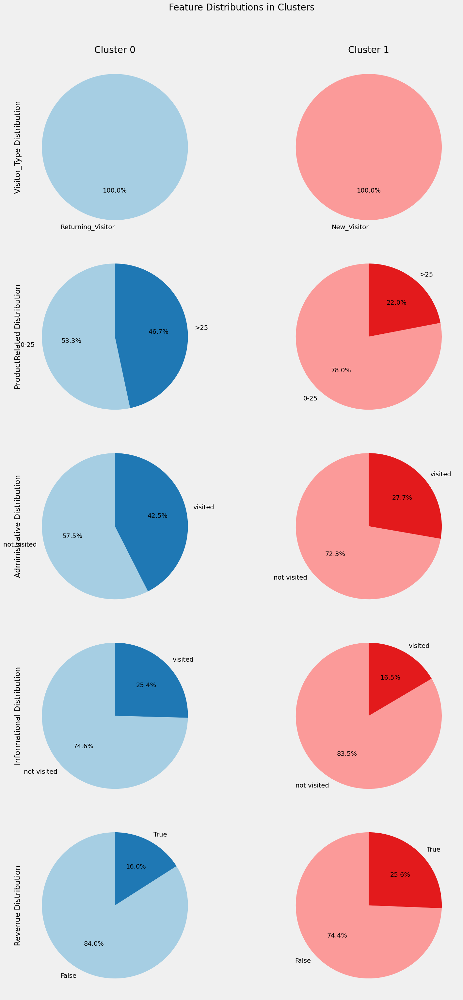

In [117]:
columns_to_visualize = ['Visitor_Type', 'ProductRelated', 'Administrative', 'Informational',  'Revenue']
cluster_counts = dataWithImportantColumnsUnscaled['Cluster'].value_counts()
total_samples = len(dataWithImportantColumnsUnscaled)
cluster_percentages = cluster_counts / total_samples * 100

cluster_colors = {
    0: ['#a6cee3', '#1f78b4', '#b2df8a'],    # Svetle nijanse plave
    1: ['#fb9a99', '#e31a1c', '#fdbf6f'],    # Svetle nijanse crvene
}

fig, axs = plt.subplots(len(columns_to_visualize), len(cluster_counts), figsize=(18, 6*len(columns_to_visualize)))

for i, column in enumerate(columns_to_visualize):
    for cluster_num, ax in zip(cluster_counts.index, axs[i]):
        cluster_data = dataWithImportantColumnsUnscaled[dataWithImportantColumnsUnscaled['Cluster'] == cluster_num]
        
        # Definisanje različitih boja za svaku vrednost u klasteru
        unique_values = cluster_data[column].unique()
        colors = cluster_colors[cluster_num]
        
        # Prikazivanje pie chart-a za trenutnu kolonu i klaster
        ax.pie(cluster_data[column].value_counts(), labels=unique_values,
               autopct='%1.1f%%', colors=colors, startangle=90)
        
        # Dodavanje naslova samo u prvi red
        if i == 0:
            ax.set_title(f'Cluster {cluster_num}')
            
    axs[i, 0].set_ylabel(f'{column} Distribution')

plt.suptitle('Feature Distributions in Clusters', y=1.02, fontsize=20)
plt.tight_layout()
plt.show()

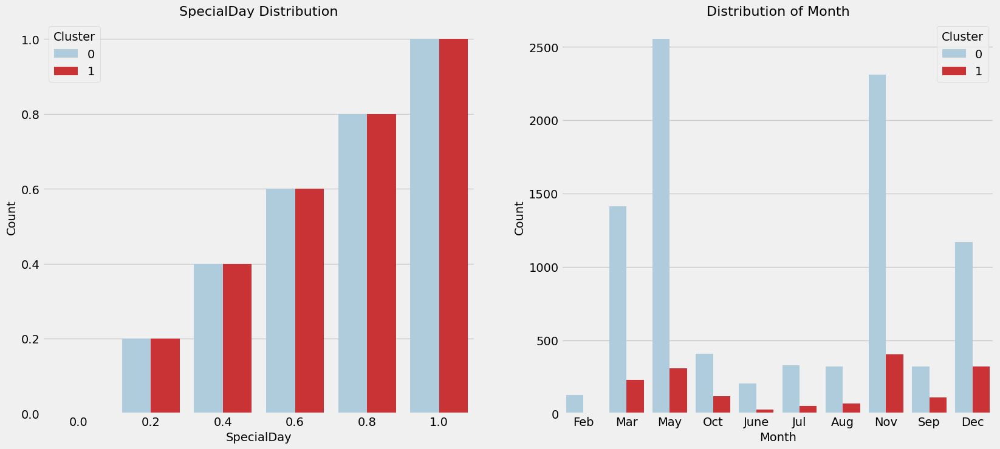

In [118]:
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

max_special_day = dataWithImportantColumnsUnscaled['SpecialDay'].max()
x_values_special_day = np.arange(0, max_special_day + 1)

cluster_colors = {
    0: '#a6cee3',    # plava
    1: '#e31a1c'     # crvena
}

sea.barplot(x='SpecialDay', y='SpecialDay', hue='Cluster', data=dataWithImportantColumnsUnscaled, ax=axes[0], palette=cluster_colors)
axes[0].set_title('SpecialDay Distribution', fontsize=16)
axes[0].set_xlabel('SpecialDay', fontsize=14)
axes[0].set_ylabel('Count', fontsize=14)

sea.countplot(x='Month', hue='Cluster', data=dataWithImportantColumnsUnscaled, ax=axes[1], palette=cluster_colors)
axes[1].set_title('Distribution of Month', fontsize=16)
axes[1].set_xlabel('Month', fontsize=14)
axes[1].set_ylabel('Count', fontsize=14)

plt.subplots_adjust(hspace=0.5)

plt.show()

<h2><strong>Zaključak</strong></h2>

__Cluster 1:__ Povratni posetioci, većina poseta nije rezultirala transakcijom, veci broj pregledanih sličnih proizvoda, administrativnih podesavanja i informacionih stranica<br>
__Cluster 2:__ Novi posetioci, većina poseta nije rezultirala transakcijom, a većina njih je pregledala manji broj stranica.


<h2><strong>Marketinška Strategija</strong></h2>

__Cluster 1 - Povratni kupci sa većim angažmanom na sajtu:__
- Fokusirati se na zadržavanje ovih korisnika na platformi i podsticanje ih na pregled dodatnih stranica.
- Personalizovani sadržaj, posebne ponude ili popusti na osnovu prethodnih poseta kupca.
- Identifikovati proizvode koji često idu zajedno sa onima koje su kupci pregledali kako bismo povećali broj kupljenih proizvoda.
- Uvođenje programa lojalnosti koji nagrađuje povratne kupce za svaku transakciju ili angažman na sajtu.
- Aktivno tražiti povratne informacije (feedback) od ovih kupaca kako bismo razumeli njihove potrebe i želje, što može informisati buduće marketinške strategije.

__Cluster 2 -  Novi kupci sa manjim angažmanom:__
- Kreirati efikasne poruke dobrodošlice i personalizovane promotivne ponude i popuste kako bismo povećali angažman novih posetilaca i ohrabrili transakcije
- Ponuditi popuste ili promotivne ponude kako bismo podstakli prve kupovine.
